In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from scipy.stats import chi2_contingency

# Data Understanding and Preparation

## Dataset Import and semantics
- *import the dataset*
- try to understand:
    - the dataset in general,
    - the dimensionality,
    - the variables and their type. (are they parsed correctly when you import the dataset?)


In [2]:
df = pd.read_csv("C:\\Users\\ACER\\Desktop\\DMML\\aac_dogs.csv", skipinitialspace=True, parse_dates=['date_of_birth','outcome_datetime', 'intake_datetime'])


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4487 entries, 0 to 4486
Data columns (total 35 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   date_of_birth              4487 non-null   datetime64[ns]
 1   outcome_subtype            4032 non-null   object        
 2   outcome_type               4487 non-null   object        
 3   sex_upon_outcome           4487 non-null   object        
 4   outcome_datetime           4487 non-null   datetime64[ns]
 5   breed                      4487 non-null   object        
 6   color                      4487 non-null   object        
 7   found_location             4487 non-null   object        
 8   intake_condition           4487 non-null   object        
 9   intake_type                4487 non-null   object        
 10  sex_upon_intake            4487 non-null   object        
 11  count                      4487 non-null   int64         
 12  intake

In [4]:
df.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,shedding,grooming,drooling,coat_length,good_with_strangers,playfulness,protectiveness,trainability,energy,barking
0,2017-03-08,Foster,Adoption,Intact Male,2017-05-09 07:48:00,Greyhound Mix,Tan,6016 Los Cielos in Travis (TX),Normal,Stray,...,3.506990,0.365627,0.218111,0.396311,2.177002,3.191688,3.390986,2.873580,4.167703,1.974363
1,2016-07-03,Foster,Adoption,Spayed Female,2016-09-10 17:22:00,Boxer Mix,Brown/White,11719 Schiber Rd in Mustang Ridge (TX),Normal,Stray,...,1.663397,2.324304,3.481632,1.720616,4.839427,3.916796,3.144705,3.010407,4.231642,2.737943
2,2010-02-10,Partner,Transfer,Intact Male,2018-03-01 16:27:00,Chihuahua Shorthair Mix,Red,2300 Scarborough in Austin (TX),Normal,Stray,...,3.359707,0.217080,0.000000,1.507057,2.740278,3.577027,3.620172,1.832087,2.834511,5.015286
3,2006-10-22,Partner,Transfer,Neutered Male,2015-10-28 14:12:00,Pomeranian Mix,White/Black,9415 Rowlands Sayle Rd in Austin (TX),Normal,Stray,...,3.165869,2.045838,0.475766,1.696648,2.523325,2.203599,3.770284,3.482516,2.037904,3.420557
4,2016-09-07,Partner,Transfer,Spayed Female,2017-09-16 16:01:00,Shih Tzu Mix,White/Brown,3909 N Interstate 35 Service Rd in Austin (TX),Normal,Stray,...,0.172306,3.903627,0.360951,0.162845,3.372774,3.094009,2.924166,4.698562,2.944130,2.754888


In [5]:
type(df.columns) 

pandas.core.indexes.base.Index

In [6]:
type('outcome_datetime')

str

Effetuo il parsing di questi dati relativi alla date e ora e a quelli relativi alla data di nascista e data di intake

In [7]:
df.shape

(4487, 35)

In [8]:
df.columns 

Index(['date_of_birth', 'outcome_subtype', 'outcome_type', 'sex_upon_outcome',
       'outcome_datetime', 'breed', 'color', 'found_location',
       'intake_condition', 'intake_type', 'sex_upon_intake', 'count',
       'intake_datetime', 'breed_min_life_expectancy',
       'breed_max_life_expectancy', 'breed_max_height_male',
       'breed_max_height_female', 'breed_max_weight_male',
       'breed_max_weight_female', 'breed_min_height_male',
       'breed_min_height_female', 'breed_min_weight_male',
       'breed_min_weight_female', 'good_with_children', 'good_with_other_dogs',
       'shedding', 'grooming', 'drooling', 'coat_length',
       'good_with_strangers', 'playfulness', 'protectiveness', 'trainability',
       'energy', 'barking'],
      dtype='object')

## Data Distribution
- *understand the distribution of the data with various plots*
    - *are there variables that are particularly interesting?*
- start to ask questions:
    - do specific breeds have a higher chance of being adopted?
    - do specific breeds have a higher chance of being euthanized?
    - are breeds different w.r.t. playfulness, protectiveness, etc.?
    - think about other questions you could ask!
- are there variables that would immediatly useful to create?

*Understand the distribution of the data with various plots (box plot, histogram, scatter plot, bar plot ...)
are there variables that are particularly interesting?*

Per farmi un'idea della distribuzione dei dati ho realizzato dei plot con una caratteristica come la playfullnes e di seguito tutti gli 
istrogrammi delle diverse features numeriche e uno scatterplot che indaga il rapporto tra barking e playfullness



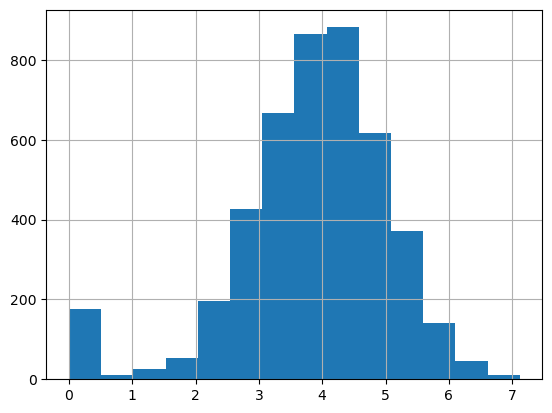

In [9]:
k = int(np.ceil(np.log2(len(df)) + 1))
df['playfulness'].hist(bins=k)
plt.show()    

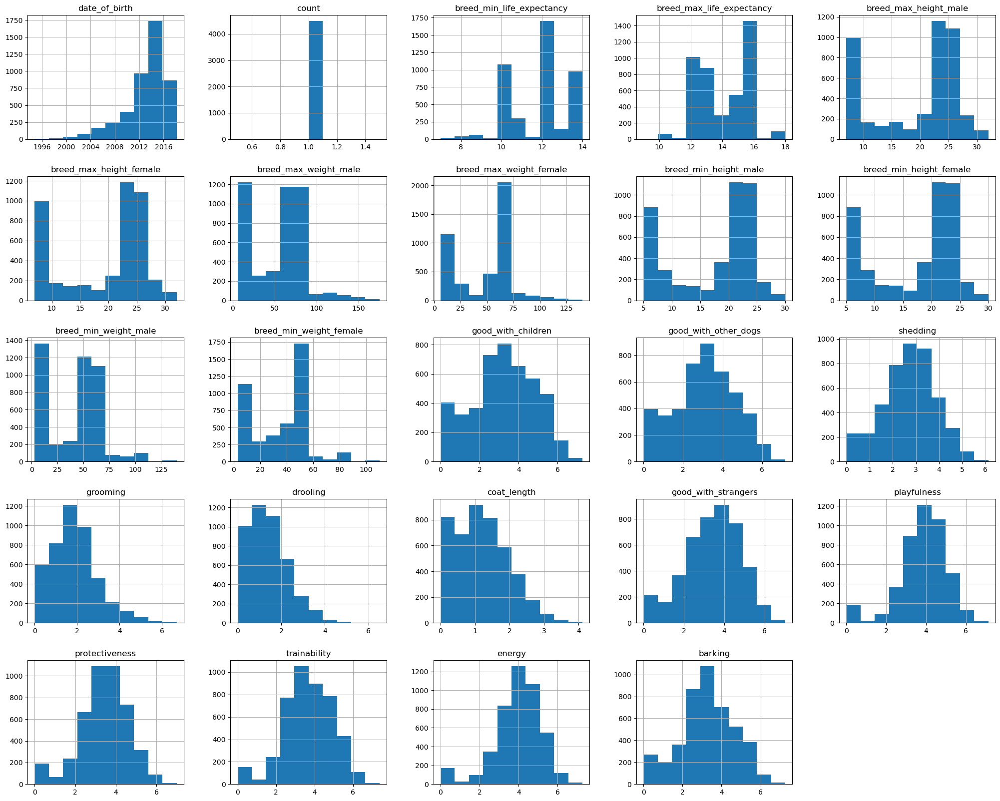

In [10]:
df_numeric = df.drop(columns=['outcome_datetime', 'intake_datetime'], errors='ignore')
df_numeric.hist(figsize=(25, 20))
plt.show()

Osservando le distrubuzioni si nota che le caratteristiche comportamentali dei cani hanno distribuzioni più uniformi e simmetriche, mentre quelle relative alle caratteristche fisiche presentano distribuzioni asimmetriche con picchi in particolari punti

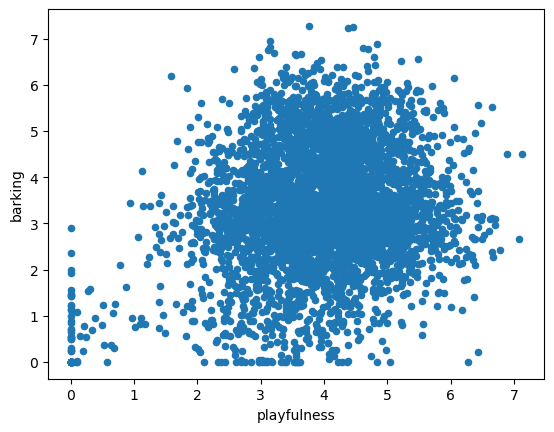

In [11]:
x = 'playfulness'
y = 'barking'
df.plot.scatter(x=x, y=y)
plt.show()    

Non sembra esserci una relazione lineare tra le due variabili.
I punti tendono a concentrarsi intorno ai valori medi delle due variabili.

Sembrano presenti outliers, alcuni cani molto giocosi pche sembano abbaiare poco, altri abbaiare tanto ma essere poco giocosi e altri che hanno punteggi alti e bassi in entrambe le dimensioni. 

Queste differenze potrebbero essere mediate dalla razza.

*Can you make the plots separating by some categorical variable?*

Vista la numerosità di alcune variabili categoriale come la Breed, è necessario lavorare con dei subset

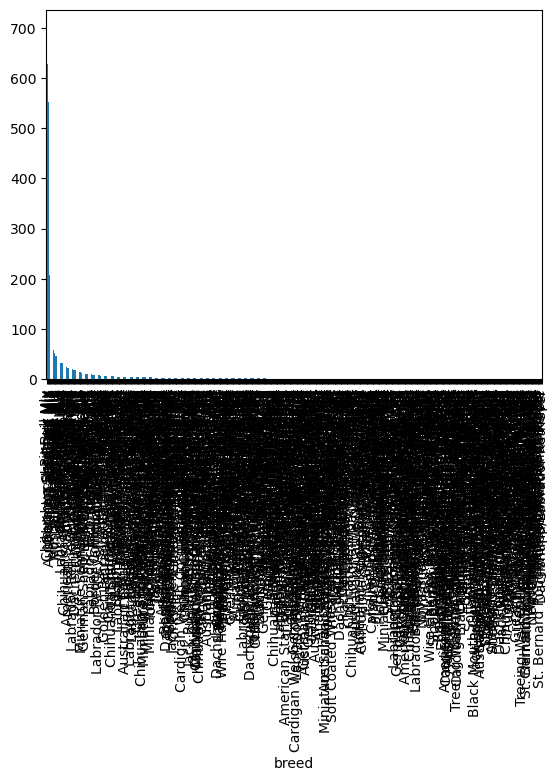

In [12]:
df['breed'].value_counts().plot(kind='bar')
plt.show()

*Can you make the plots on a subset containing only the most common breeds?*

In [13]:
df_breed = df[['breed']]
print(df_breed.head())

                     breed
0            Greyhound Mix
1                Boxer Mix
2  Chihuahua Shorthair Mix
3           Pomeranian Mix
4             Shih Tzu Mix


In [14]:
df_breed = df[['breed']]
print(df_breed)

                        breed
0               Greyhound Mix
1                   Boxer Mix
2     Chihuahua Shorthair Mix
3              Pomeranian Mix
4                Shih Tzu Mix
...                       ...
4482   Chihuahua Longhair Mix
4483             Pit Bull Mix
4484       Border Terrier Mix
4485                 Pit Bull
4486             Pit Bull Mix

[4487 rows x 1 columns]


Osservando le razze uniche si nota la presenza di razze miste

In [15]:
unique_breeds = df['breed'].unique()
print(unique_breeds) 

['Greyhound Mix' 'Boxer Mix' 'Chihuahua Shorthair Mix' 'Pomeranian Mix'
 'Shih Tzu Mix' 'Plott Hound Mix' 'Papillon/Skye Terrier'
 'Miniature Schnauzer/Miniature Poodle' 'Labrador Retriever Mix'
 'American Bulldog Mix' 'Cardigan Welsh Corgi Mix'
 'Australian Cattle Dog Mix' 'Siberian Husky Mix' 'Pit Bull Mix'
 'Irish Setter Mix' 'Great Pyrenees Mix' 'Pug Mix'
 'Norfolk Terrier/Yorkshire Terrier' 'Dachshund Longhair/Cocker Spaniel'
 'German Shepherd Mix' 'Papillon Mix' 'Basset Hound Mix' 'Pomeranian'
 'Australian Kelpie Mix' 'Smooth Fox Terrier Mix'
 'Rat Terrier/Boston Terrier' 'German Shepherd/Labrador Retriever'
 'Catahoula/Labrador Retriever' 'Scottish Terrier' 'Yorkshire Terrier Mix'
 'Labrador Retriever/Chihuahua Shorthair' 'Doberman Pinsch'
 'Dachshund Mix' 'Dachshund/Chihuahua Shorthair'
 'Rat Terrier/Queensland Heeler' 'German Wirehaired Pointer'
 'Miniature Poodle' 'Beagle Mix' 'Dachshund/Rat Terrier'
 'Australian Cattle Dog/Labrador Retriever' 'Pug'
 'Chihuahua Shorthair/Rat 

In [16]:
number_of_breeds = df['breed'].nunique()
print(number_of_breeds)

574


Ho selezionato le 10 razze più frequenti

In [17]:
top_10_breeds=list(df['breed'].value_counts().index)[:10] #filtro le prime 10 

In [18]:
df['breed'].isin(list(df['breed'].value_counts().index)[:10])

0       False
1        True
2        True
3       False
4        True
        ...  
4482    False
4483     True
4484    False
4485    False
4486     True
Name: breed, Length: 4487, dtype: bool

In [19]:
df[df['breed'].isin(['Pit Bull Mix', 'Chihuahua Shorthair Mix', 'Labrador Retriever Mix','German Shepherd Mix', 'Australian Cattle Dog Mix','Dachshund Mix', 'Boxer Mix', 'Border Collie Mix', 'Shih Tzu Mix','Australian Shepherd Mix'])]


,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,shedding,grooming,drooling,coat_length,good_with_strangers,playfulness,protectiveness,trainability,energy,barking
1,2016-07-03,Foster,Adoption,Spayed Female,2016-09-10 17:22:00,Boxer Mix,Brown/White,11719 Schiber Rd in Mustang Ridge (TX),Normal,Stray,...,1.663397,2.324304,3.481632,1.720616,4.839427,3.916796,3.144705,3.010407,4.231642,2.737943
2,2010-02-10,Partner,Transfer,Intact Male,2018-03-01 16:27:00,Chihuahua Shorthair Mix,Red,2300 Scarborough in Austin (TX),Normal,Stray,...,3.359707,0.217080,0.000000,1.507057,2.740278,3.577027,3.620172,1.832087,2.834511,5.015286
4,2016-09-07,Partner,Transfer,Spayed Female,2017-09-16 16:01:00,Shih Tzu Mix,White/Brown,3909 N Interstate 35 Service Rd in Austin (TX),Normal,Stray,...,0.172306,3.903627,0.360951,0.162845,3.372774,3.094009,2.924166,4.698562,2.944130,2.754888
8,2017-07-14,Partner,Transfer,Intact Male,2017-07-21 18:08:00,Labrador Retriever Mix,Tan/White,Airport And 290 in Austin (TX),Normal,Stray,...,4.946290,2.572693,1.777277,0.965470,4.655712,7.119640,3.575653,4.514976,5.404228,4.506239
10,2014-04-14,Foster,Adoption,Spayed Female,2016-09-20 09:19:00,Labrador Retriever Mix,White,15500 Goforth Road in Creedmoor (TX),Normal,Stray,...,4.143614,1.751516,2.406355,0.771277,4.999612,5.344255,3.028714,5.510420,5.371233,3.536094
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4474,2015-09-17,NaN,Return to Owner,Intact Female,2016-09-19 13:04:00,Labrador Retriever Mix,Black,12521 Twin Creeks Rd in Austin (TX),Injured,Stray,...,3.211721,1.619805,1.603824,1.777112,4.194023,5.327762,4.491306,4.898522,4.643951,2.285094
4476,1999-09-02,NaN,Return to Owner,Neutered Male,2014-09-02 11:06:00,Dachshund Mix,Black/Brown,1817 East Oltorf Street in Austin (TX),Normal,Stray,...,2.238315,1.499816,1.715425,1.434061,4.356390,3.743778,4.396103,3.200248,3.688791,4.513860
4481,2009-11-01,NaN,Return to Owner,Spayed Female,2013-11-04 16:35:00,Australian Cattle Dog Mix,Blue Tick,2201 Plainfield Ct in Pflugerville (TX),Normal,Stray,...,2.639376,1.657611,1.325220,1.306256,2.294224,3.101365,5.176757,4.757004,4.563453,1.752861
4483,2016-08-04,NaN,Return to Owner,Intact Female,2017-03-05 18:53:00,Pit Bull Mix,Black/White,Pevetoe St And Crownover St in Austin (TX),Normal,Stray,...,2.118580,2.332269,1.217937,0.490648,2.051769,4.362945,3.744065,2.582030,4.313444,2.962705


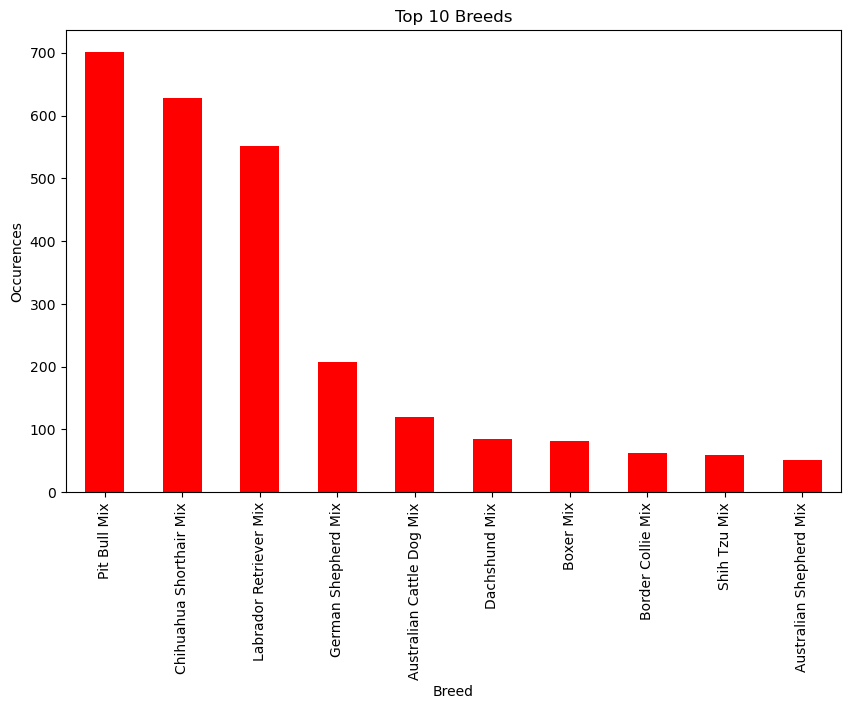

In [20]:

top_10_breeds = ['Pit Bull Mix', 'Chihuahua Shorthair Mix', 'Labrador Retriever Mix',
              'German Shepherd Mix', 'Australian Cattle Dog Mix', 'Dachshund Mix', 
              'Boxer Mix', 'Border Collie Mix', 'Shih Tzu Mix', 'Australian Shepherd Mix']
df_filtered = df[df['breed'].isin(top_10_breeds)]  
breed_counts = df_filtered['breed'].value_counts()

plt.figure(figsize=(10,6))
breed_counts.plot(kind='bar', color='red')  
plt.xlabel('Breed')
plt.ylabel('Occurences')
plt.title('Top 10 Breeds')
plt.show()



*Do specific breeds have a higher chance of being adopted? (hint: maybe a crosstab bar plot?)*
*Do specific breeds have a higher chance of being euthanized?*

Pit Bull Mix, Chihuahua Shorthair Mix, Labrador Retriever Mix

Questo risultato emerge osservando la frequenza di questo tipo di outcome nella top 10 razze, top 30 razze con l'osservazione in questo caso sia della frequenza in termini assoluti che relativi

In [21]:
df.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,shedding,grooming,drooling,coat_length,good_with_strangers,playfulness,protectiveness,trainability,energy,barking
0,2017-03-08,Foster,Adoption,Intact Male,2017-05-09 07:48:00,Greyhound Mix,Tan,6016 Los Cielos in Travis (TX),Normal,Stray,...,3.506990,0.365627,0.218111,0.396311,2.177002,3.191688,3.390986,2.873580,4.167703,1.974363
1,2016-07-03,Foster,Adoption,Spayed Female,2016-09-10 17:22:00,Boxer Mix,Brown/White,11719 Schiber Rd in Mustang Ridge (TX),Normal,Stray,...,1.663397,2.324304,3.481632,1.720616,4.839427,3.916796,3.144705,3.010407,4.231642,2.737943
2,2010-02-10,Partner,Transfer,Intact Male,2018-03-01 16:27:00,Chihuahua Shorthair Mix,Red,2300 Scarborough in Austin (TX),Normal,Stray,...,3.359707,0.217080,0.000000,1.507057,2.740278,3.577027,3.620172,1.832087,2.834511,5.015286
3,2006-10-22,Partner,Transfer,Neutered Male,2015-10-28 14:12:00,Pomeranian Mix,White/Black,9415 Rowlands Sayle Rd in Austin (TX),Normal,Stray,...,3.165869,2.045838,0.475766,1.696648,2.523325,2.203599,3.770284,3.482516,2.037904,3.420557
4,2016-09-07,Partner,Transfer,Spayed Female,2017-09-16 16:01:00,Shih Tzu Mix,White/Brown,3909 N Interstate 35 Service Rd in Austin (TX),Normal,Stray,...,0.172306,3.903627,0.360951,0.162845,3.372774,3.094009,2.924166,4.698562,2.944130,2.754888


In [22]:
df['outcome_type'].unique()

array(['Adoption', 'Transfer', 'Euthanasia', 'Died', 'Missing',
       'Return to Owner', 'Disposal', 'Rto-Adopt'], dtype=object)

In [23]:
pc = pd.crosstab(df_filtered['breed'], df_filtered['outcome_type'])
pcn = pc.div(pc.sum(1).astype(float), axis=0)

In [24]:
pcn

outcome_type,Adoption,Died,Disposal,Euthanasia,Missing,Return to Owner,Transfer
breed,,,,,,,
Australian Cattle Dog Mix,0.275000,0.016667,0.000000,0.100000,0.000000,0.033333,0.575000
Australian Shepherd Mix,0.365385,0.019231,0.000000,0.096154,0.000000,0.019231,0.500000
Border Collie Mix,0.301587,0.000000,0.000000,0.095238,0.000000,0.063492,0.539683
Boxer Mix,0.246914,0.012346,0.000000,0.123457,0.000000,0.098765,0.518519
Chihuahua Shorthair Mix,0.205414,0.004777,0.001592,0.085987,0.001592,0.023885,0.676752
Dachshund Mix,0.188235,0.000000,0.000000,0.023529,0.000000,0.035294,0.752941
German Shepherd Mix,0.250000,0.000000,0.000000,0.096154,0.000000,0.043269,0.610577
Labrador Retriever Mix,0.269928,0.009058,0.000000,0.068841,0.000000,0.036232,0.615942
Pit Bull Mix,0.142653,0.007133,0.000000,0.201141,0.007133,0.044223,0.597718


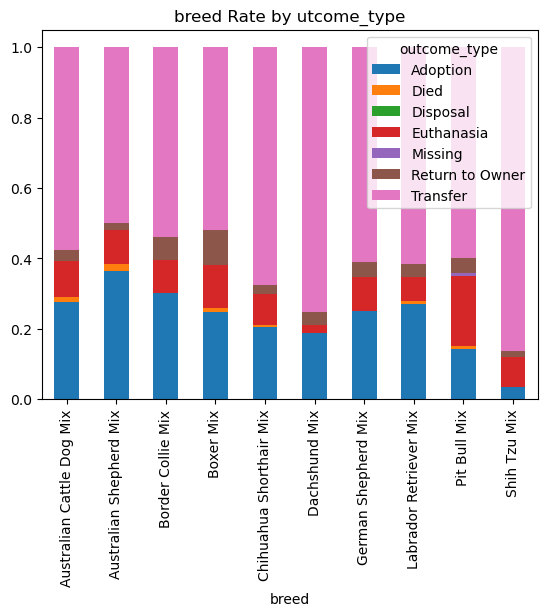

In [25]:

x = 'breed'
y = 'utcome_type'

pc = pd.crosstab(df_filtered['breed'], df_filtered['outcome_type'])
pcn = pc.div(pc.sum(1).astype(float), axis=0)
pcn.plot(kind='bar', stacked=True,title='%s Rate by %s' % (x, y))


plt.show()

La top 10  delle razze potrebbe non essere una quantità abbastanza rappresentativa del dataset .

Per farmi un'idea del numero di razze più frequenti da selezionare ossservo la loro frequenza cumulata.


le  30 razze più frequenti coprono il 71% dei valori del dataset

In [26]:
breed_counts = df['breed'].value_counts()

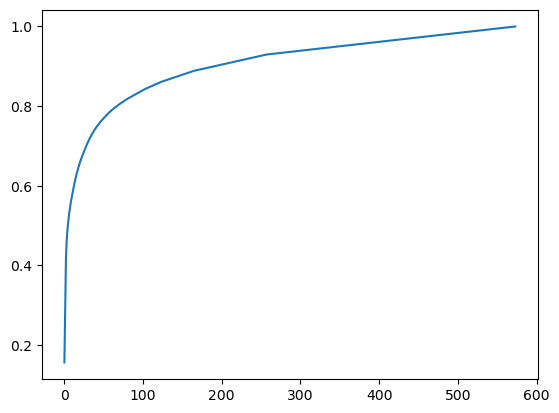

In [27]:
plt.plot(np.arange(0,len(breed_counts)),np.cumsum(breed_counts/len(df)))


In [28]:
np.cumsum(breed_counts/len(df)).iloc[30]

0.7100512591932248

In [29]:
breed_counts

breed
Pit Bull Mix                                 701
Chihuahua Shorthair Mix                      628
Labrador Retriever Mix                       552
German Shepherd Mix                          208
Australian Cattle Dog Mix                    120
                                            ... 
Lhasa Apso/Cocker Spaniel                      1
Standard Schnauzer                             1
St. Bernard Rough Coat/Labrador Retriever      1
Whippet/Australian Kelpie                      1
Dachshund/Labrador Retriever                   1
Name: count, Length: 574, dtype: int64

In [30]:
top_30_breeds=list(df['breed'].value_counts().index)[:30] 

In [31]:
def divide_breeds(v):
    if v in top_30_breeds:
        return v
    else:
        return 'other' 


In [32]:
divide_breeds('Greyhound Mix')

'other'

Creo la feature breed_category per separare la top30 delle  razze dalle altre meno frequenti

In [33]:
df['breed_category']=df['breed'].apply(divide_breeds)

In [34]:
df.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,grooming,drooling,coat_length,good_with_strangers,playfulness,protectiveness,trainability,energy,barking,breed_category
0,2017-03-08,Foster,Adoption,Intact Male,2017-05-09 07:48:00,Greyhound Mix,Tan,6016 Los Cielos in Travis (TX),Normal,Stray,...,0.365627,0.218111,0.396311,2.177002,3.191688,3.390986,2.873580,4.167703,1.974363,other
1,2016-07-03,Foster,Adoption,Spayed Female,2016-09-10 17:22:00,Boxer Mix,Brown/White,11719 Schiber Rd in Mustang Ridge (TX),Normal,Stray,...,2.324304,3.481632,1.720616,4.839427,3.916796,3.144705,3.010407,4.231642,2.737943,Boxer Mix
2,2010-02-10,Partner,Transfer,Intact Male,2018-03-01 16:27:00,Chihuahua Shorthair Mix,Red,2300 Scarborough in Austin (TX),Normal,Stray,...,0.217080,0.000000,1.507057,2.740278,3.577027,3.620172,1.832087,2.834511,5.015286,Chihuahua Shorthair Mix
3,2006-10-22,Partner,Transfer,Neutered Male,2015-10-28 14:12:00,Pomeranian Mix,White/Black,9415 Rowlands Sayle Rd in Austin (TX),Normal,Stray,...,2.045838,0.475766,1.696648,2.523325,2.203599,3.770284,3.482516,2.037904,3.420557,other
4,2016-09-07,Partner,Transfer,Spayed Female,2017-09-16 16:01:00,Shih Tzu Mix,White/Brown,3909 N Interstate 35 Service Rd in Austin (TX),Normal,Stray,...,3.903627,0.360951,0.162845,3.372774,3.094009,2.924166,4.698562,2.944130,2.754888,Shih Tzu Mix


In [35]:
df_outcome_filtered=df[df['outcome_type'].isin(['Adoption', 'Euthanasia'])]

Frequenza relativa

In [36]:
pc = pd.crosstab(df_outcome_filtered['breed_category'], df_outcome_filtered['outcome_type'])
pcn = pc.div(pc.sum(1).astype(float), axis=0) 

In [37]:
pcn

outcome_type,Adoption,Euthanasia
breed_category,,
American Bulldog Mix,0.750000,0.250000
American Staffordshire Terrier Mix,0.300000,0.700000
Anatol Shepherd Mix,0.875000,0.125000
Australian Cattle Dog Mix,0.733333,0.266667
Australian Kelpie Mix,0.777778,0.222222
Australian Shepherd Mix,0.791667,0.208333
Beagle Mix,0.733333,0.266667
Border Collie Mix,0.760000,0.240000
Boxer Mix,0.666667,0.333333


<Axes: title={'center': 'breed Rate by utcome_type'}, xlabel='breed_category'>

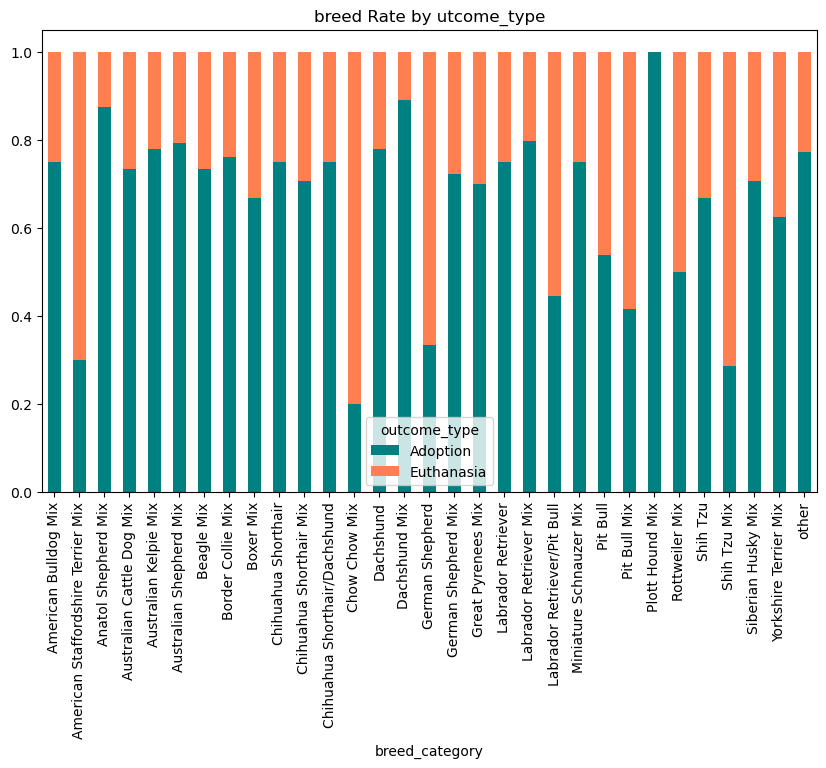

In [38]:

x = 'breed'
y = 'utcome_type'

pcn.plot(kind='bar', stacked=True,title='%s Rate by %s' % (x, y),figsize=(10, 6),color=['teal', 'coral'])



Frequenza assoluta

In [39]:
pc = pd.crosstab(df_outcome_filtered['breed_category'], df_outcome_filtered['outcome_type']) 
pcn = pc

In [40]:
pcn

outcome_type,Adoption,Euthanasia
breed_category,,
American Bulldog Mix,6,2
American Staffordshire Terrier Mix,3,7
Anatol Shepherd Mix,7,1
Australian Cattle Dog Mix,33,12
Australian Kelpie Mix,7,2
Australian Shepherd Mix,19,5
Beagle Mix,11,4
Border Collie Mix,19,6
Boxer Mix,20,10


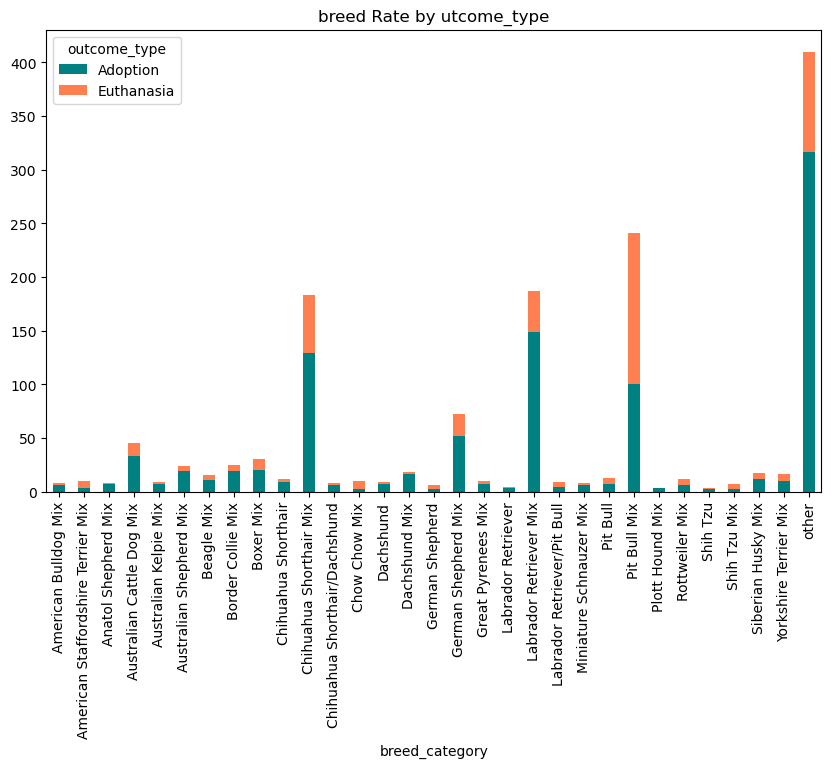

In [41]:
x = 'breed'
y = 'utcome_type'

pcn.plot(kind='bar', stacked=True,title='%s Rate by %s' % (x, y),figsize=(10, 6),color=['teal', 'coral'])



plt.show()

*Are breeds different w.r.t. playfulness, protectiveness, etc.? (hint: maybe a scatter plot? )*





Per rispondere a questo domanda ho realizzato una serie di scatter matrix sulla top 3 razze per avere dei risultati più leggibili e interpretabili e sulla top 10 e top 30 razze per osservare più esemplari. Le razze si differenziano per queste caratteristiche, ad esempio nella top 3 i Labrador Retriver  sono più addestraibili  e giocosi rispetto ai Pitbull Mix e ai Chihuahua short hair Mix. 

Osservando la relazione tra barking e protectivness nellala top 10  e nella top 30 si oserva che i Chihuahua short hair Mix abbaiano di più e sono più protettivi rispetto alle altre razze

In [42]:
top_3_breeds=list(df['breed'].value_counts().index)[:3]

In [43]:
df_top3 =df[df['breed'].isin(top_3_breeds)]

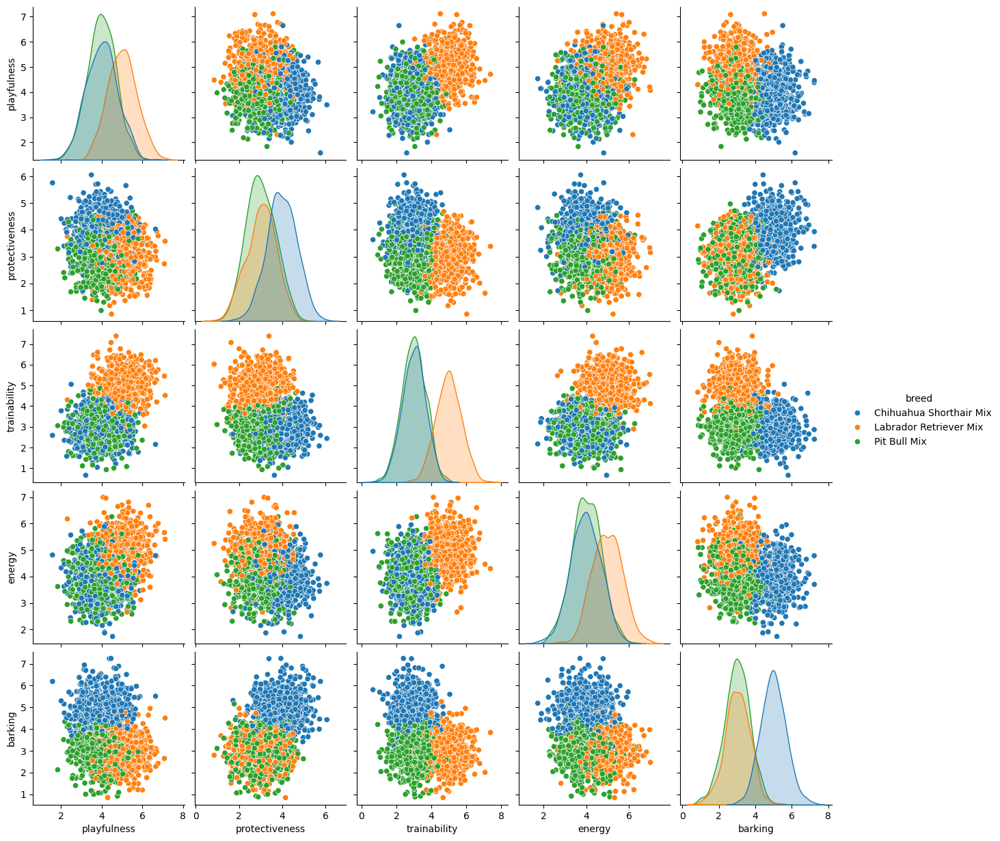

In [44]:
sns.pairplot(df_top3[['playfulness', 'protectiveness', 'trainability', 'energy', 'barking', 'breed']], hue='breed')

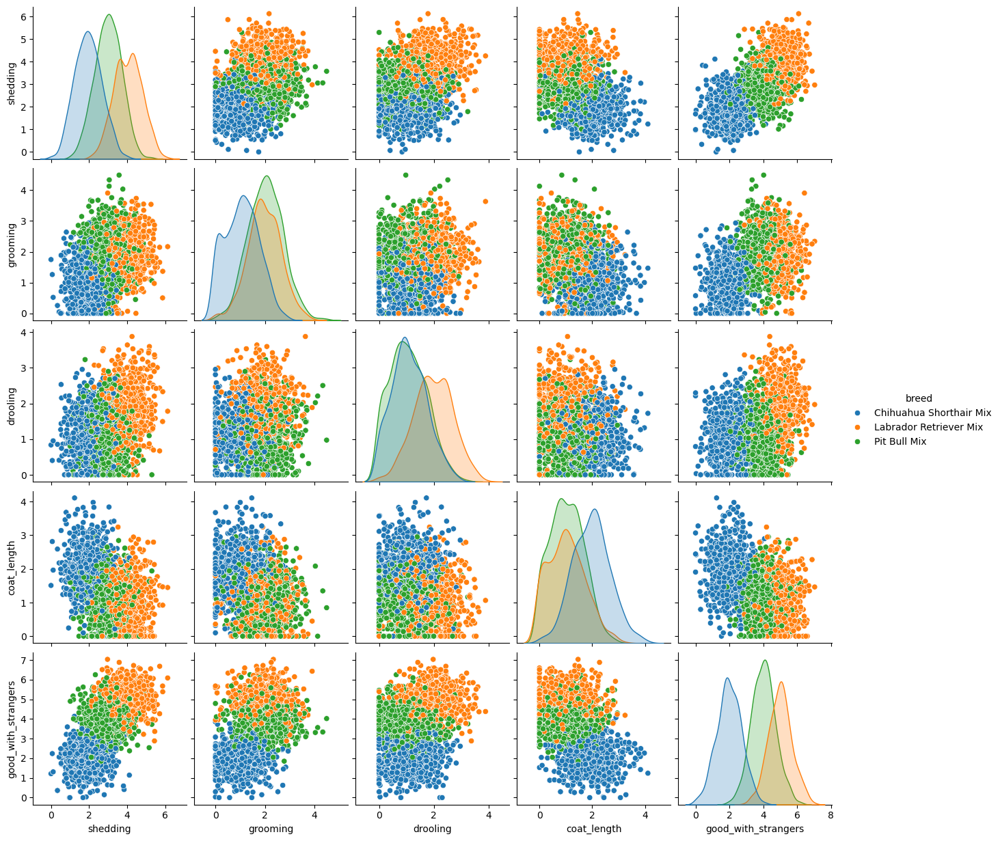

In [45]:
sns.pairplot(df_top3[['shedding', 'grooming', 'drooling', 'coat_length','good_with_strangers','breed']], hue='breed')

In [46]:
df_top10 =df[df['breed'].isin(top_10_breeds)]

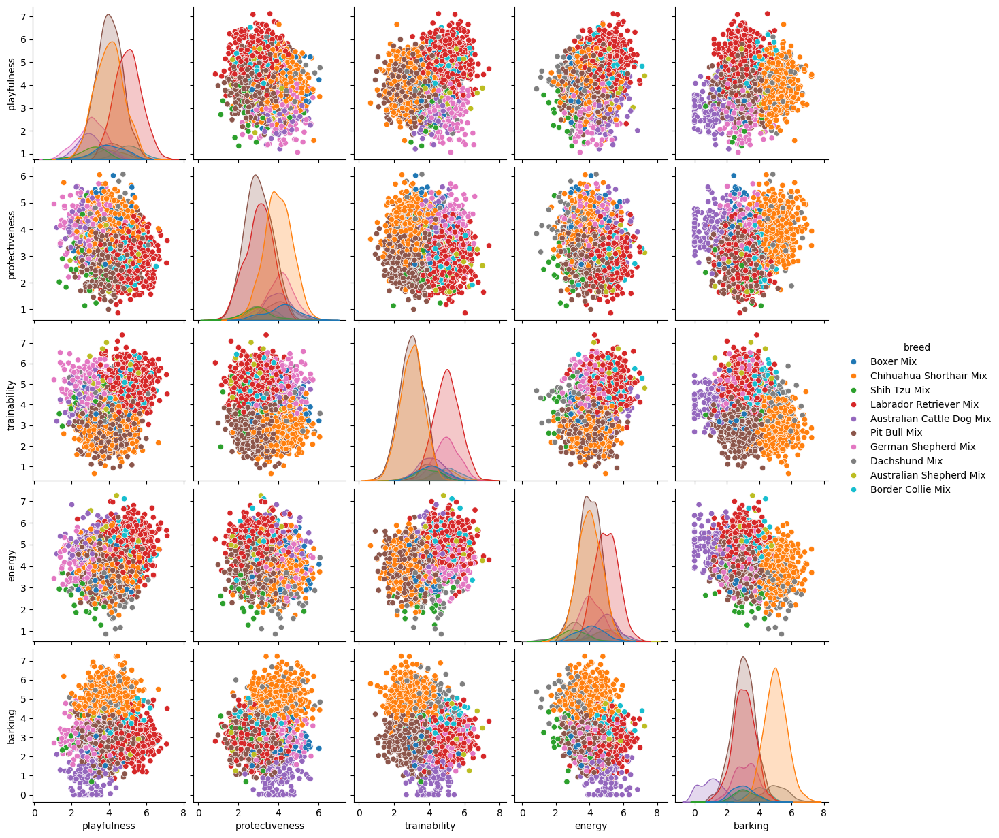

In [47]:
sns.pairplot(df_top10[['playfulness', 'protectiveness', 'trainability', 'energy', 'barking', 'breed']], hue='breed')

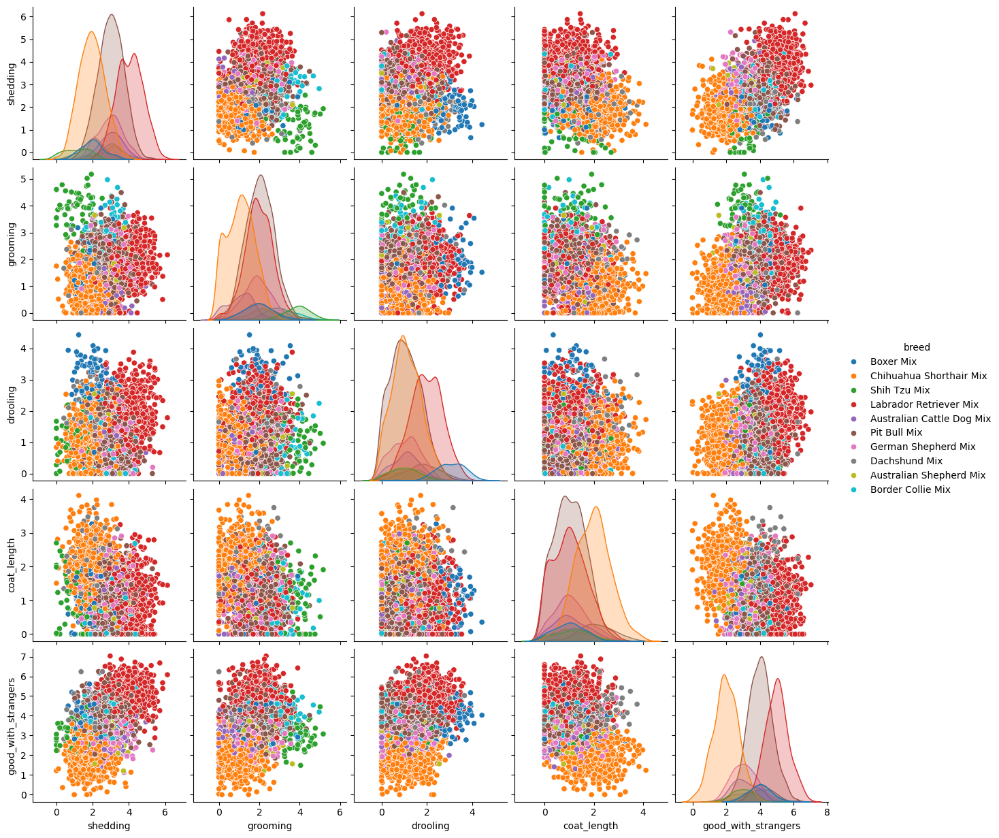

In [48]:
sns.pairplot(df_top10[['shedding', 'grooming', 'drooling', 'coat_length','good_with_strangers','breed']], hue='breed')

In [49]:
df_top30 = df[df['breed'].isin(top_30_breeds)]

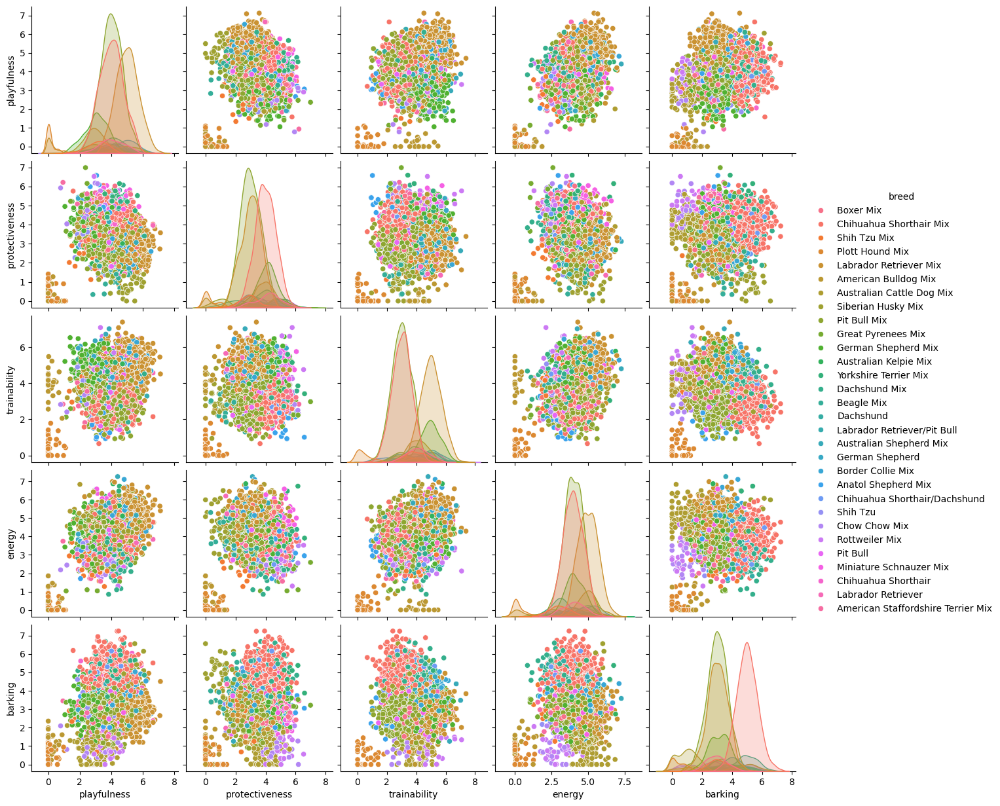

In [50]:
sns.pairplot(df_top30[['playfulness', 'protectiveness', 'trainability', 'energy', 'barking', 'breed']], hue='breed')

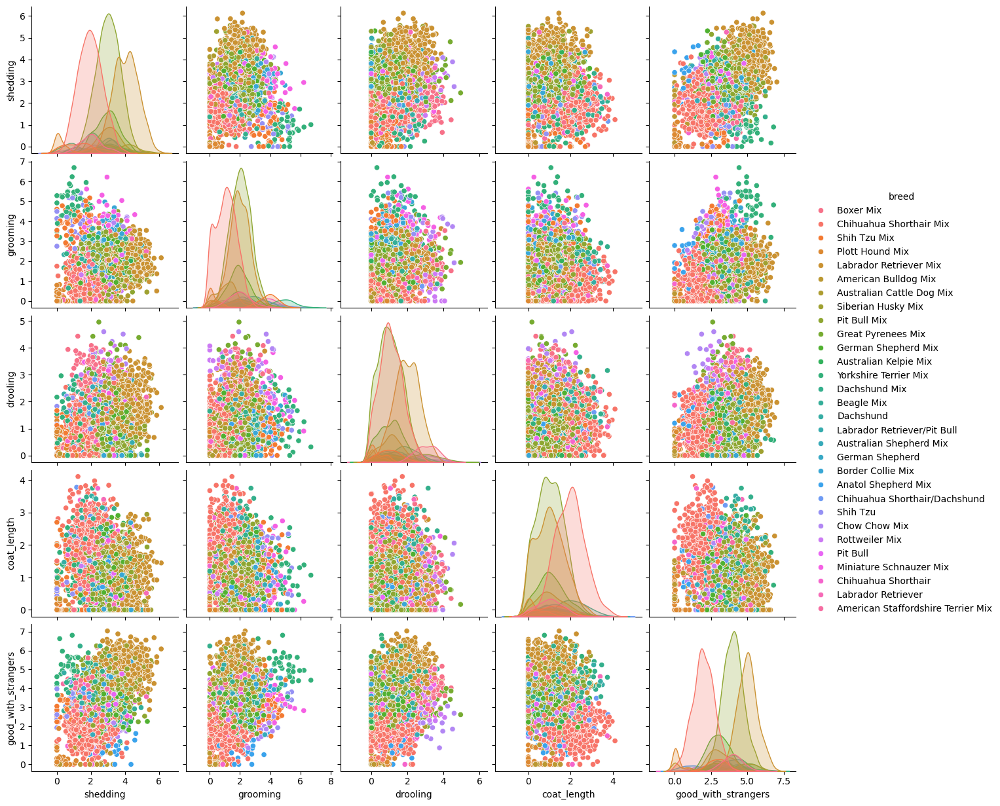

In [51]:
sns.pairplot(df_top30[['shedding', 'grooming', 'drooling', 'coat_length','good_with_strangers','breed']], hue='breed')

Dall'osservazione delle matrici di correlazione  sottostanti non risultato variabili rindondanti evidenti

<Axes: >

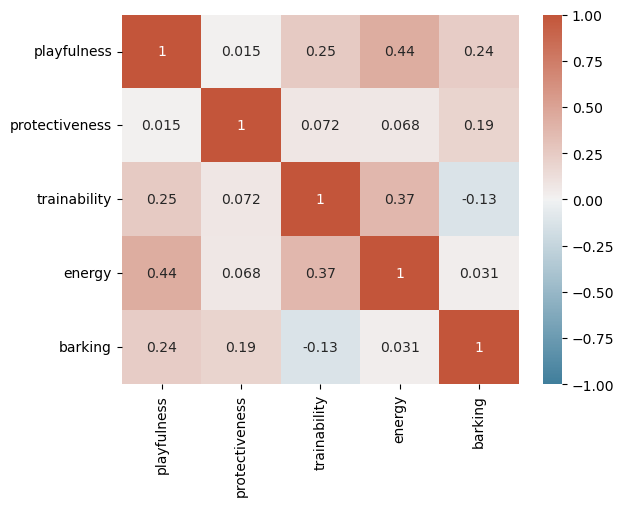

In [52]:
corr = df_top30[['playfulness', 'protectiveness', 'trainability',
       'energy', 'barking']].corr()
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, cmap=cmap, vmin=-1, vmax=1, annot=True)

<Axes: >

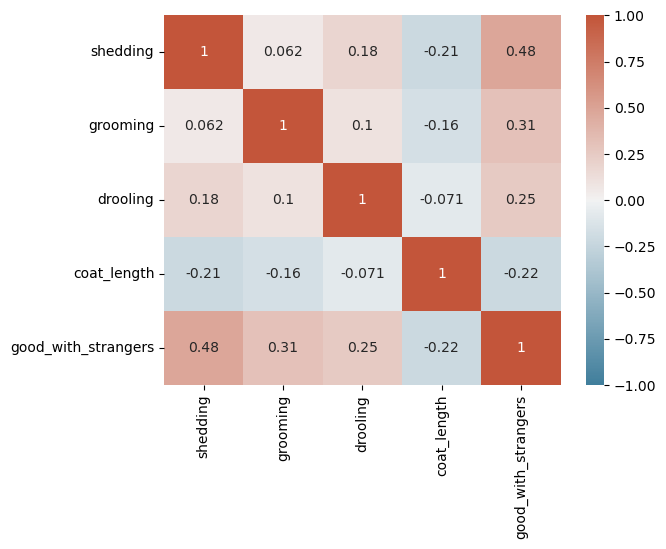

In [53]:
corr = df_top30[['shedding', 'grooming', 'drooling', 'coat_length','good_with_strangers']].corr()
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, cmap=cmap, vmin=-1, vmax=1, annot=True)

*Are there variables that would immediatly useful to create?*

1- Variabile delle 30 razze vs le altre  più frequenti creata in precedenza per lavorare su un  sottoninsieme rappresentativo della popolazione del dataset


2-Età del cane all'ingresso, età del cane nel momento della sua uscita dal canile(adozione, eutanasia, trasferimento) per possibili analisi sul tempo di permanenza al rifiugio, il rapporto tra età del cane e tipo di outcome, aspettativa di vita.


3- Colore del cane visto che nel dataset esistono anche cani con il pelo di colori misti e capire i colori più comuni, per possibili analisi su come  il colore del cane potrebbe influenzare le adozioni o la percezione delle sue caratteristiche come la playfulness etc.

4-La razza del cane che presenta un pattern simile alla colonna dei colori, esistono cani di razza pura e altri di razza mista, sarebbe interessante capire se gli outcomes, l'aspettativa di vita e le caratteristiche comportamentali del cane siano influenzate dalla razza.

*Variabili relative all'età*

In [54]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4487 entries, 0 to 4486
Data columns (total 36 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   date_of_birth              4487 non-null   datetime64[ns]
 1   outcome_subtype            4032 non-null   object        
 2   outcome_type               4487 non-null   object        
 3   sex_upon_outcome           4487 non-null   object        
 4   outcome_datetime           4487 non-null   datetime64[ns]
 5   breed                      4487 non-null   object        
 6   color                      4487 non-null   object        
 7   found_location             4487 non-null   object        
 8   intake_condition           4487 non-null   object        
 9   intake_type                4487 non-null   object        
 10  sex_upon_intake            4487 non-null   object        
 11  count                      4487 non-null   int64         
 12  intake

In [55]:
df["age_upon_intake"] = (df["intake_datetime"] - df["date_of_birth"]).dt.total_seconds() / (60 * 60 * 24 * 365)


In [56]:
df.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,drooling,coat_length,good_with_strangers,playfulness,protectiveness,trainability,energy,barking,breed_category,age_upon_intake
0,2017-03-08,Foster,Adoption,Intact Male,2017-05-09 07:48:00,Greyhound Mix,Tan,6016 Los Cielos in Travis (TX),Normal,Stray,...,0.218111,0.396311,2.177002,3.191688,3.390986,2.873580,4.167703,1.974363,other,0.086952
1,2016-07-03,Foster,Adoption,Spayed Female,2016-09-10 17:22:00,Boxer Mix,Brown/White,11719 Schiber Rd in Mustang Ridge (TX),Normal,Stray,...,3.481632,1.720616,4.839427,3.916796,3.144705,3.010407,4.231642,2.737943,Boxer Mix,0.102705
2,2010-02-10,Partner,Transfer,Intact Male,2018-03-01 16:27:00,Chihuahua Shorthair Mix,Red,2300 Scarborough in Austin (TX),Normal,Stray,...,0.000000,1.507057,2.740278,3.577027,3.620172,1.832087,2.834511,5.015286,Chihuahua Shorthair Mix,8.045179
3,2006-10-22,Partner,Transfer,Neutered Male,2015-10-28 14:12:00,Pomeranian Mix,White/Black,9415 Rowlands Sayle Rd in Austin (TX),Normal,Stray,...,0.475766,1.696648,2.523325,2.203599,3.770284,3.482516,2.037904,3.420557,other,9.006752
4,2016-09-07,Partner,Transfer,Spayed Female,2017-09-16 16:01:00,Shih Tzu Mix,White/Brown,3909 N Interstate 35 Service Rd in Austin (TX),Normal,Stray,...,0.360951,0.162845,3.372774,3.094009,2.924166,4.698562,2.944130,2.754888,Shih Tzu Mix,1.014930


In [57]:
df["age_upon_outcome"] = (df["outcome_datetime"] - df["date_of_birth"]).dt.total_seconds() / (60 * 60 * 24 * 365)

In [58]:
df.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,coat_length,good_with_strangers,playfulness,protectiveness,trainability,energy,barking,breed_category,age_upon_intake,age_upon_outcome
0,2017-03-08,Foster,Adoption,Intact Male,2017-05-09 07:48:00,Greyhound Mix,Tan,6016 Los Cielos in Travis (TX),Normal,Stray,...,0.396311,2.177002,3.191688,3.390986,2.873580,4.167703,1.974363,other,0.086952,0.170753
1,2016-07-03,Foster,Adoption,Spayed Female,2016-09-10 17:22:00,Boxer Mix,Brown/White,11719 Schiber Rd in Mustang Ridge (TX),Normal,Stray,...,1.720616,4.839427,3.916796,3.144705,3.010407,4.231642,2.737943,Boxer Mix,0.102705,0.191024
2,2010-02-10,Partner,Transfer,Intact Male,2018-03-01 16:27:00,Chihuahua Shorthair Mix,Red,2300 Scarborough in Austin (TX),Normal,Stray,...,1.507057,2.740278,3.577027,3.620172,1.832087,2.834511,5.015286,Chihuahua Shorthair Mix,8.045179,8.059412
3,2006-10-22,Partner,Transfer,Neutered Male,2015-10-28 14:12:00,Pomeranian Mix,White/Black,9415 Rowlands Sayle Rd in Austin (TX),Normal,Stray,...,1.696648,2.523325,2.203599,3.770284,3.482516,2.037904,3.420557,other,9.006752,9.023539
4,2016-09-07,Partner,Transfer,Spayed Female,2017-09-16 16:01:00,Shih Tzu Mix,White/Brown,3909 N Interstate 35 Service Rd in Austin (TX),Normal,Stray,...,0.162845,3.372774,3.094009,2.924166,4.698562,2.944130,2.754888,Shih Tzu Mix,1.014930,1.026486


*Variabile colore*

Per creare questa feature ho osservato sia la frequenza cumulata dei colori associati, sia quella dei singoli colori per osservare quali colori fosssero più frequenti di altri. 

Per esemplicità e per evitare di introdurre bias ho  optato per la creazione di una variabile one hot encoding basata sulla presenza del singolo colore nonostante questo abbia portato alla creazione di una colonna per ogni valore dei colori.

In [59]:
df['color'].unique()


array(['Tan', 'Brown/White', 'Red', 'White/Black', 'White/Brown',
       'Brown Brindle', 'Cream', 'Tan/White', 'White/Tan', 'White',
       'Cream/White', 'Black', 'Yellow/White', 'Brown/Cream',
       'Black/Brown', 'Sable', 'Red/Brown', 'Fawn/Black', 'Tan/Black',
       'Black/White', 'Tricolor', 'Brown', 'Blue Merle', 'Blue/White',
       'Buff', 'Brown/Black', 'Tan/Brown', 'Red/Tan',
       'Black/Brown Brindle', 'Brown Brindle/White', 'Blue Tick',
       'Gray/Black', 'Red Tick/White', 'Chocolate/White', 'Yellow',
       'Chocolate/Tan', 'Red/White', 'Black/Tan', 'Gray/White', 'Tan/Red',
       'Blue', 'White/Blue', 'Fawn/White', 'Black/Black', 'White/Gray',
       'Black Brindle/White', 'Brown Merle/Black', 'Brown/Tan',
       'Sable/White', 'Silver/Red', 'Gray', 'White/Red', 'Chocolate',
       'Gold', 'Black/Gray', 'Brown Tiger', 'Tan/Blue',
       'White/Brown Brindle', 'Fawn', 'White/Chocolate', 'White/Cream',
       'Red Merle', 'Black/Brown Merle', 'Tricolor/Brown',
      

In [60]:
df['color'].nunique()

180

In [61]:
df["color"].value_counts()


color
Black/White        512
Black              293
Brown/White        263
Tan                241
Brown              223
                  ... 
Tan/Tricolor         1
Gray/Gold            1
Brown/Chocolate      1
Black/Chocolate      1
Black/Blue Tick      1
Name: count, Length: 180, dtype: int64

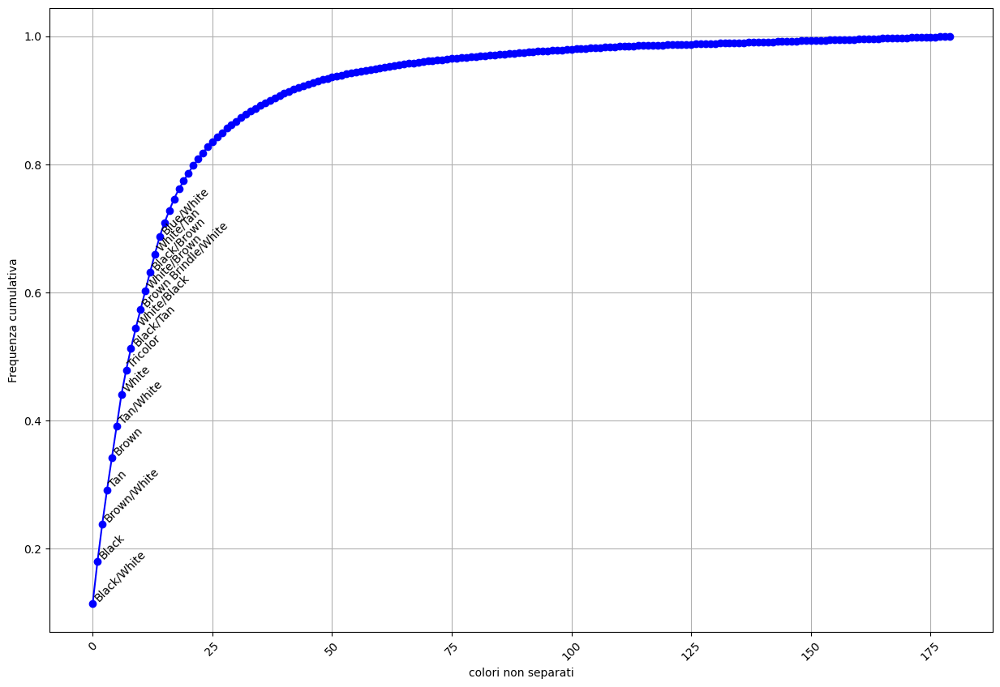

In [62]:
color_counts = df["color"].value_counts() 
cumulative_freq = np.cumsum(color_counts / len(df))
plt.figure(figsize=(15,10))
plt.plot(np.arange(0, len(color_counts)), cumulative_freq, marker="o", linestyle="-", color="b")
num_labels = 15  
for i in range(min(num_labels, len(color_counts))):
    plt.text(i, cumulative_freq.iloc[i], color_counts.index[i], fontsize=10, rotation=45, verticalalignment='bottom')
plt.xlabel('colori non separati')
plt.ylabel('Frequenza cumulativa')
plt.xticks(rotation=45)
plt.grid()

plt.show()


A livello grafico, la frequenza dei colori non separati risulta poco interpretabili, mentre nel grafico successivo è possibile vedere che i primi 10 colori rapresentano il 90 % del dataset

In [63]:
all_colors = df["color"].dropna().str.split("/").sum()
color_counts = Counter(all_colors)
color_df = pd.DataFrame(color_counts.items(), columns=["Color", "Count"]).sort_values(by="Count", ascending=False)



In [64]:
print(color_df.head(180))

             Color  Count
2            White   2309
4            Black   1490
0              Tan    925
1            Brown    922
5    Brown Brindle    272
10        Tricolor    207
3              Red    192
12            Blue    183
17       Chocolate    139
6            Cream     90
8            Sable     89
15            Gray     83
13            Buff     79
9             Fawn     66
7           Yellow     58
11      Blue Merle     36
18   Black Brindle     25
21            Gold     23
14       Blue Tick     19
16        Red Tick     17
20          Silver     16
19     Brown Merle     16
24  Yellow Brindle      8
23       Red Merle      7
26         Apricot      5
29          Orange      4
30           Liver      4
22     Brown Tiger      3
28      Blue Tiger      2
32      Liver Tick      2
25          Tortie      1
27      Blue Cream      1
31     Black Smoke      1


In [65]:
df_colors = df["color"].str.get_dummies(sep="/")
df = pd.concat([df, df_colors], axis=1)


In [66]:
df.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,Red Merle,Red Tick,Sable,Silver,Tan,Tortie,Tricolor,White,Yellow,Yellow Brindle
0,2017-03-08,Foster,Adoption,Intact Male,2017-05-09 07:48:00,Greyhound Mix,Tan,6016 Los Cielos in Travis (TX),Normal,Stray,...,0,0,0,0,1,0,0,0,0,0
1,2016-07-03,Foster,Adoption,Spayed Female,2016-09-10 17:22:00,Boxer Mix,Brown/White,11719 Schiber Rd in Mustang Ridge (TX),Normal,Stray,...,0,0,0,0,0,0,0,1,0,0
2,2010-02-10,Partner,Transfer,Intact Male,2018-03-01 16:27:00,Chihuahua Shorthair Mix,Red,2300 Scarborough in Austin (TX),Normal,Stray,...,0,0,0,0,0,0,0,0,0,0
3,2006-10-22,Partner,Transfer,Neutered Male,2015-10-28 14:12:00,Pomeranian Mix,White/Black,9415 Rowlands Sayle Rd in Austin (TX),Normal,Stray,...,0,0,0,0,0,0,0,1,0,0
4,2016-09-07,Partner,Transfer,Spayed Female,2017-09-16 16:01:00,Shih Tzu Mix,White/Brown,3909 N Interstate 35 Service Rd in Austin (TX),Normal,Stray,...,0,0,0,0,0,0,0,1,0,0


In [67]:
df.columns

Index(['date_of_birth', 'outcome_subtype', 'outcome_type', 'sex_upon_outcome',
       'outcome_datetime', 'breed', 'color', 'found_location',
       'intake_condition', 'intake_type', 'sex_upon_intake', 'count',
       'intake_datetime', 'breed_min_life_expectancy',
       'breed_max_life_expectancy', 'breed_max_height_male',
       'breed_max_height_female', 'breed_max_weight_male',
       'breed_max_weight_female', 'breed_min_height_male',
       'breed_min_height_female', 'breed_min_weight_male',
       'breed_min_weight_female', 'good_with_children', 'good_with_other_dogs',
       'shedding', 'grooming', 'drooling', 'coat_length',
       'good_with_strangers', 'playfulness', 'protectiveness', 'trainability',
       'energy', 'barking', 'breed_category', 'age_upon_intake',
       'age_upon_outcome', 'Apricot', 'Black', 'Black Brindle', 'Black Smoke',
       'Blue', 'Blue Cream', 'Blue Merle', 'Blue Tick', 'Blue Tiger', 'Brown',
       'Brown Brindle', 'Brown Merle', 'Brown Tiger', '

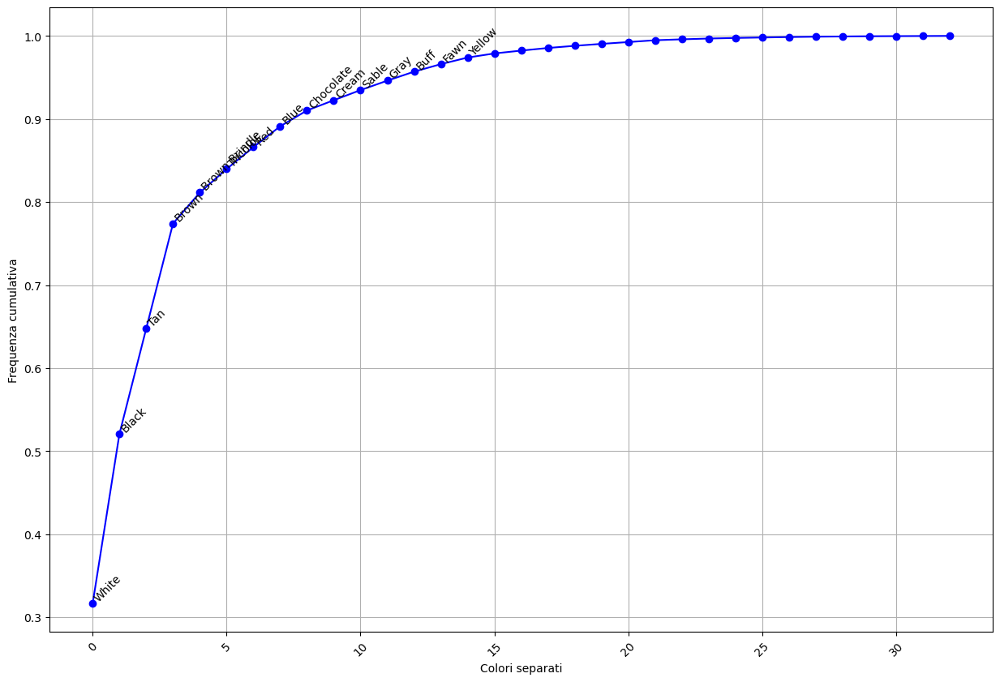

In [68]:
cumulative_freq = np.cumsum(color_df["Count"] / color_df["Count"].sum())
plt.figure(figsize=(15,10))
plt.plot(np.arange(0, len(color_df)), cumulative_freq, marker="o", linestyle="-", color="b")
num_labels = 15  
for i in range(min(num_labels, len(color_df))):
    plt.text(i, cumulative_freq.iloc[i], color_df.iloc[i, 0], fontsize=10, rotation=45, verticalalignment='bottom')
plt.xlabel('Colori separati')
plt.ylabel('Frequenza cumulativa')
plt.xticks(rotation=45)
plt.grid()
plt.show()


*Variabile razza mista*

Anche in questo caso ho usato one hot encoding

In [69]:
def Mixed_breed(breed):
    if "Mix" in str(breed) or "/" in str(breed):  
        return 1  
    else:
        return 0 

In [70]:
df['Mixed_breed'] = df['breed'].apply(Mixed_breed)


In [71]:
df[['breed', 'Mixed_breed']].head()

,breed,Mixed_breed
0,Greyhound Mix,1
1,Boxer Mix,1
2,Chihuahua Shorthair Mix,1
3,Pomeranian Mix,1
4,Shih Tzu Mix,1


In [72]:
df[['breed', 'Mixed_breed']].tail()

,breed,Mixed_breed
4482,Chihuahua Longhair Mix,1
4483,Pit Bull Mix,1
4484,Border Terrier Mix,1
4485,Pit Bull,0
4486,Pit Bull Mix,1


## Data Quality
- *check for missing values, duplicates, redundant variables, outliers*
- *handle these issues*
- check for missing values, duplicates, redundant variables, outliers:
  
-how many missing values are there for each variable?

-can you see outliers in the boxplots?

-can you see outliers in the scatter plots?

-what's the difference between these two kinds of outliers?

-handle these issues

In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4487 entries, 0 to 4486
Data columns (total 72 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   date_of_birth              4487 non-null   datetime64[ns]
 1   outcome_subtype            4032 non-null   object        
 2   outcome_type               4487 non-null   object        
 3   sex_upon_outcome           4487 non-null   object        
 4   outcome_datetime           4487 non-null   datetime64[ns]
 5   breed                      4487 non-null   object        
 6   color                      4487 non-null   object        
 7   found_location             4487 non-null   object        
 8   intake_condition           4487 non-null   object        
 9   intake_type                4487 non-null   object        
 10  sex_upon_intake            4487 non-null   object        
 11  count                      4487 non-null   int64         
 12  intake

In [74]:
df.isnull().sum(0)

date_of_birth         0
outcome_subtype     455
outcome_type          0
sex_upon_outcome      0
outcome_datetime      0
                   ... 
Tricolor              0
White                 0
Yellow                0
Yellow Brindle        0
Mixed_breed           0
Length: 72, dtype: int64

I missing values relativi alla variabili categoriali riguardano la feature outcome_subtype mentre per le variabili numeriche tutta una serie di variabile relative all'aspettatitiva di vita, al peso e all'altezza del cane

In [75]:
missing_values = df.isnull().sum(0)
missing_values = missing_values[missing_values > 0]
print(missing_values)


outcome_subtype              455
breed_min_life_expectancy    113
breed_max_life_expectancy    113
breed_max_height_male        113
breed_max_height_female      113
breed_max_weight_male        113
breed_max_weight_female      113
breed_min_height_male        113
breed_min_height_female      113
breed_min_weight_male        113
breed_min_weight_female      113
dtype: int64


In [76]:
df[df['outcome_subtype'].isnull()]

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,Red Tick,Sable,Silver,Tan,Tortie,Tricolor,White,Yellow,Yellow Brindle,Mixed_breed
4000,2013-09-16,NaN,Return to Owner,Neutered Male,2015-05-07 13:26:00,Chihuahua Shorthair Mix,Black/White,2117 Surrender Ave in Pflugerville (TX),Normal,Stray,...,0,0,0,0,0,0,1,0,0,1
4001,2017-02-16,NaN,Return to Owner,Intact Male,2017-05-18 15:59:00,Labrador Retriever Mix,Black/White,Hartsmith Dr And Austin Colonys Blvd in Austin...,Normal,Stray,...,0,0,0,0,0,0,1,0,0,1
4002,2015-08-19,NaN,Return to Owner,Intact Female,2016-08-19 19:11:00,Mastiff/Rottweiler,Tan/Black,2005 Willow Creek in Austin (TX),Normal,Public Assist,...,0,0,0,1,0,0,0,0,0,1
4003,2014-06-08,NaN,Adoption,Spayed Female,2015-06-15 12:29:00,Jack Russell Terrier Mix,White/Tan,Austin (TX),Normal,Stray,...,0,0,0,1,0,0,1,0,0,1
4004,2015-10-19,NaN,Adoption,Spayed Female,2016-02-23 17:00:00,Labrador Retriever Mix,Black,Ih 35 And Hwy 290 in Austin (TX),Normal,Stray,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4482,2017-06-04,NaN,Adoption,Spayed Female,2018-02-05 18:37:00,Chihuahua Longhair Mix,White/Red,Austin (TX),Normal,Owner Surrender,...,0,0,0,0,0,0,1,0,0,1
4483,2016-08-04,NaN,Return to Owner,Intact Female,2017-03-05 18:53:00,Pit Bull Mix,Black/White,Pevetoe St And Crownover St in Austin (TX),Normal,Stray,...,0,0,0,0,0,0,1,0,0,1
4484,2016-08-09,NaN,Adoption,Neutered Male,2017-08-13 17:33:00,Border Terrier Mix,White,Austin (TX),Normal,Stray,...,0,0,0,0,0,0,1,0,0,1
4485,2005-04-16,NaN,Return to Owner,Neutered Male,2015-07-30 17:32:00,Pit Bull,Chocolate/White,1156 Cesar Chavez in Austin (TX),Normal,Public Assist,...,0,0,0,0,0,0,1,0,0,0


In [77]:
df['outcome_subtype'].value_counts()

outcome_subtype
Partner                2820
Foster                  630
Suffering               216
Aggressive              147
Offsite                  80
Behavior                 42
In Kennel                22
Medical                  21
Rabies Risk              19
Court/Investigation      10
At Vet                    8
In Foster                 7
Possible Theft            4
In Surgery                3
Enroute                   2
Barn                      1
Name: count, dtype: int64

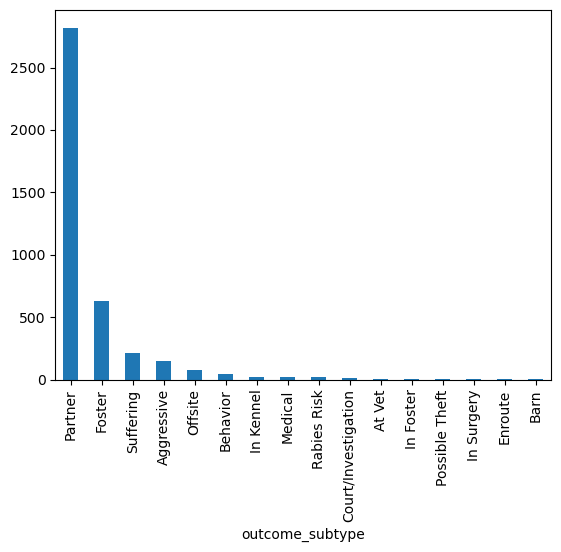

In [78]:
df['outcome_subtype'].value_counts().plot(kind='bar')
plt.show()

Dal grafico si evince che l'outcome_subtype più frequente è Partner

In [79]:
df['outcome_subtype'].mode()[0] 

'Partner'

Prima di procedere nella sostituzione dei valori nulli 
verifico la possibile relazione tra outcome_subtype e outcome_type

In [80]:
outcome= pd.crosstab(df['outcome_type'], df['outcome_subtype'])

In [81]:
pc = pd.crosstab(df['outcome_type'], df['outcome_subtype'])
pco = pc.div(pc.sum(1).astype(float), axis=0) 

In [82]:
pco

outcome_subtype,Aggressive,At Vet,Barn,Behavior,Court/Investigation,Enroute,Foster,In Foster,In Kennel,In Surgery,Medical,Offsite,Partner,Possible Theft,Rabies Risk,Suffering
outcome_type,,,,,,,,,,,,,,,,
Adoption,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.887324,0.000000,0.000000,0.000000,0.000000,0.112676,0.000000,0.000000,0.000000,0.000000
Died,0.000000,0.162162,0.000000,0.000000,0.000000,0.054054,0.000000,0.135135,0.567568,0.081081,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Euthanasia,0.321663,0.004376,0.000000,0.091904,0.021882,0.000000,0.000000,0.000000,0.000000,0.000000,0.045952,0.000000,0.000000,0.000000,0.041575,0.472648
Missing,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.285714,0.142857,0.000000,0.000000,0.000000,0.000000,0.571429,0.000000,0.000000
Transfer,0.000000,0.000000,0.000354,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.999646,0.000000,0.000000,0.000000


<Axes: title={'center': 'outcome_type Rate by outcome_subtype'}, xlabel='outcome_type'>

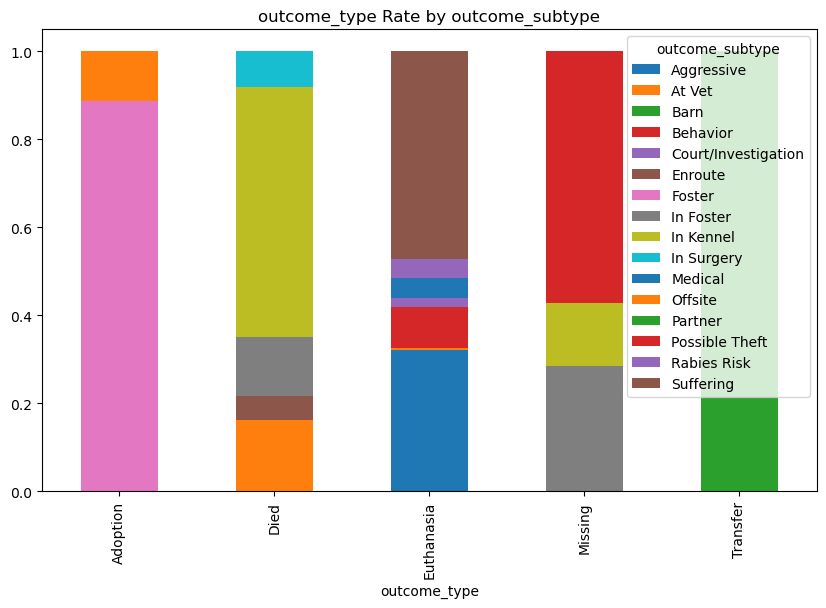

In [83]:
x = 'outcome_type'
y = 'outcome_subtype'

pco.plot(kind='bar', stacked=True,title='%s Rate by %s' % (x, y),figsize=(10, 6))

Dall'osservazione  delle frequenza e da quella qualitativa del grafico derivato sembrerebbe che alcuni presentino particolari sub_type in base all'outcome ad esempio i cani che hanno subito eutanasia 

presentano come outcome subtype: Aggressive, At Vet, Behavior, Court/Investigation, Medical, Rabies Risk, Suffering.

In [84]:
chi2, p, dof, expected = chi2_contingency(pco)

print('Chi-Square Statistic: {}'.format(chi2))
print('P-value: {}'.format(p))


Chi-Square Statistic: 17.89865082314973
P-value: 0.9999999754960688


La realazione tra le feature è  non significativa.


Per riempire i valori nulli e segnalare la presenza di questi senza alterare la distribuzione dei dati in maniera distorta, assegno il valore 'Unknown' a questi ultimi perchè osservando la moda c'è un 

forte sbilanciamento verso l'outcome subtype 'Partner' e per evitare distorsioni nei dati preferisco creare un categoria ulteriore per segnalare la particolarità di questi record.

In [85]:
df['outcome_subtype'] = df['outcome_subtype'].fillna('Unknown')


In [86]:
df['outcome_subtype'].isnull().sum()

0

In questa sezione ho realizzato una serie di plot come istogrammi, scatterplot e boxplot sia prima che dopo la gestione dei null values per osservare i cambiamenti nella distribuzone delle variabili.

I cambiamenti più evidenti si notano osservando l'aggiunta della mediana nel gestire i null values. Gli outliers negli scatterplot e boxplot, che saranno  mostrati e  discussi nelle sezioni  successive sono inalterati dopo la gestione dei valori.

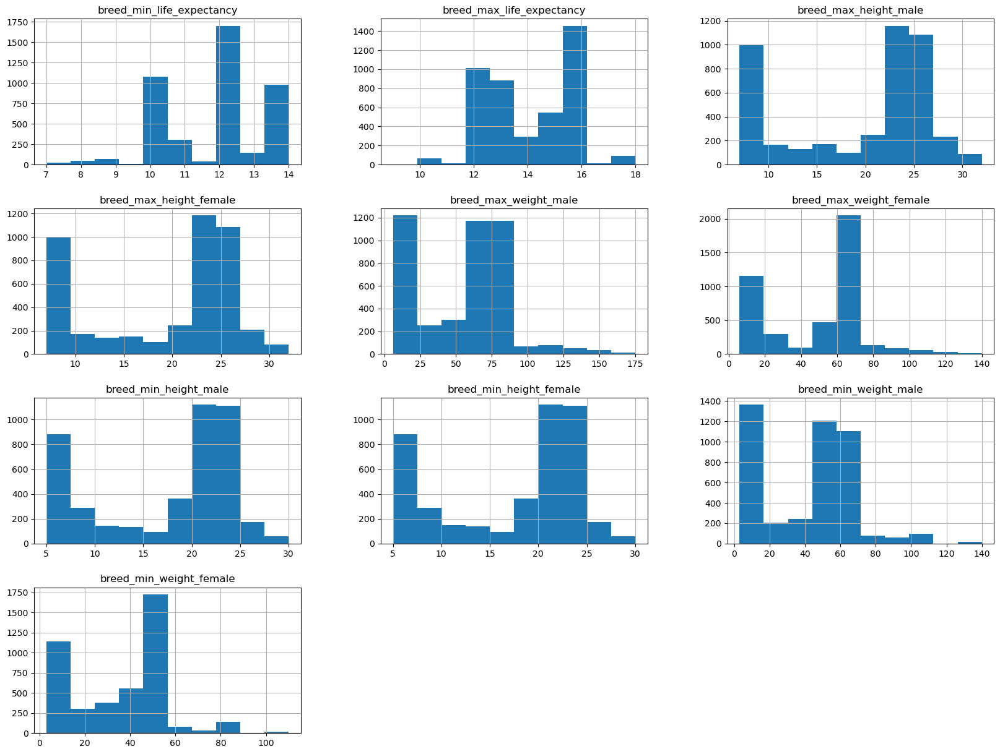

In [87]:
col= ['breed_min_life_expectancy', 'breed_max_life_expectancy', 'breed_max_height_male', 'breed_max_height_female',
          'breed_max_weight_male','breed_max_weight_female', 'breed_min_height_male', 'breed_min_height_female',
          'breed_min_weight_male', 'breed_min_weight_female']

df_numeric_selected = df[col]
df_numeric_selected.hist(figsize=(20, 15))
plt.show()


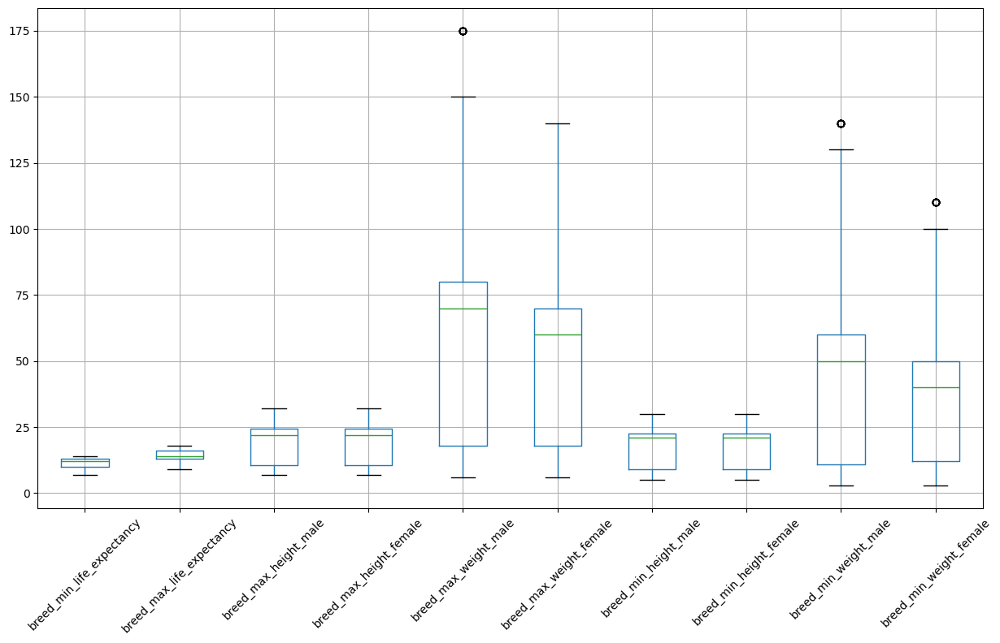

In [88]:


cols = ['breed_min_life_expectancy', 'breed_max_life_expectancy', 'breed_max_height_male', 'breed_max_height_female',
        'breed_max_weight_male', 'breed_max_weight_female', 'breed_min_height_male', 'breed_min_height_female',
        'breed_min_weight_male', 'breed_min_weight_female']

plt.figure(figsize=(15, 8))
df[cols].boxplot(rot=45) 
plt.show()


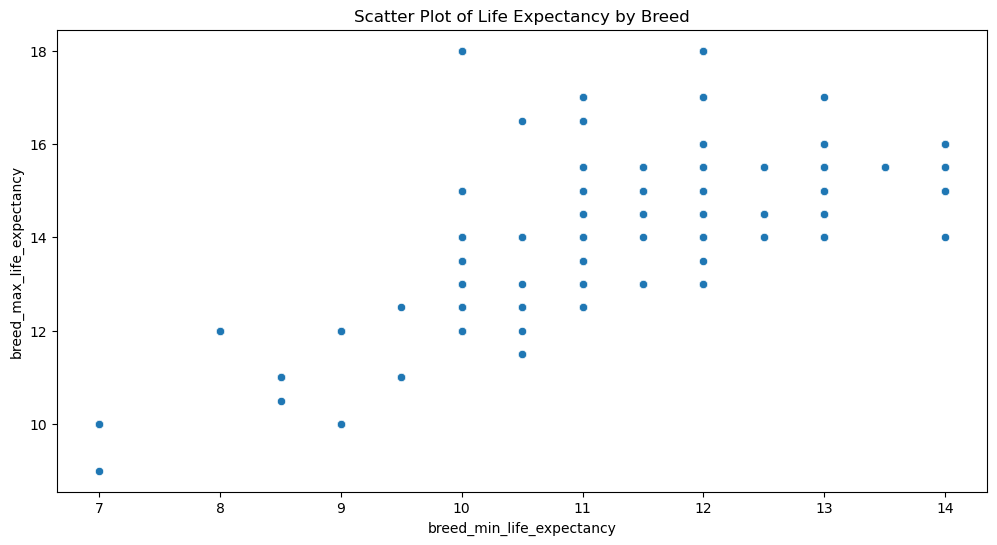

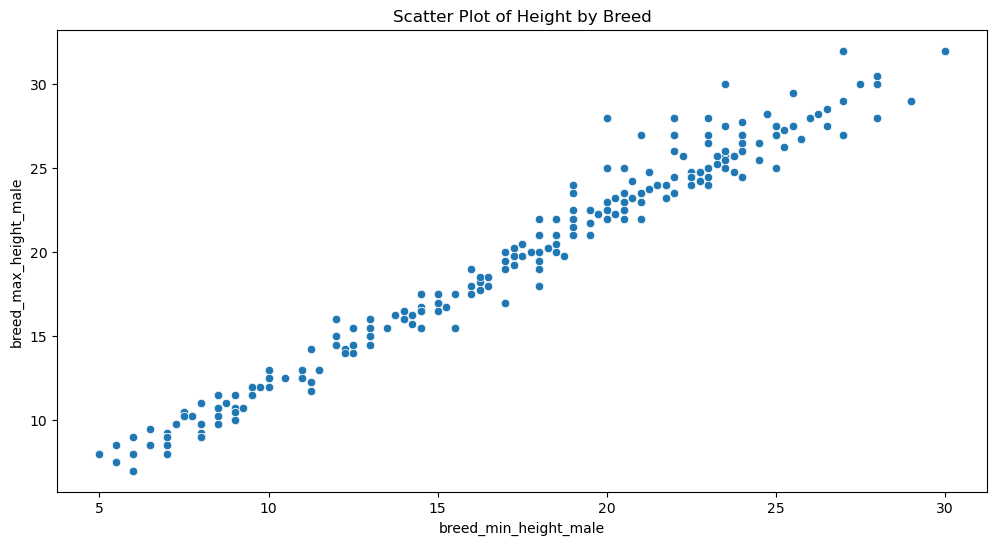

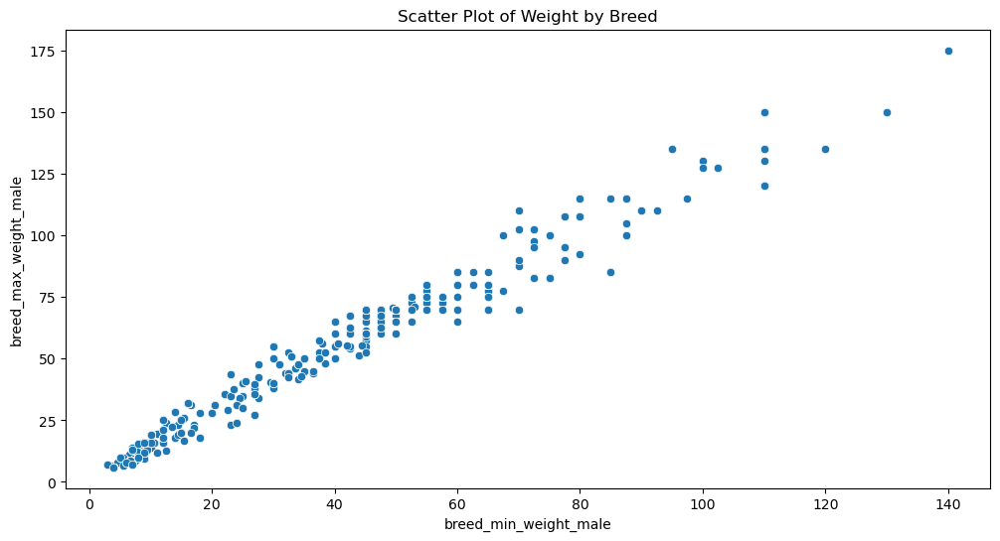

In [89]:

plt.figure(figsize=(12, 6))
sns.scatterplot(x=df['breed_min_life_expectancy'], y=df['breed_max_life_expectancy'])
plt.xlabel('breed_min_life_expectancy')
plt.ylabel('breed_max_life_expectancy')
plt.title('Scatter Plot of Life Expectancy by Breed')
plt.show()


plt.figure(figsize=(12, 6))
sns.scatterplot(x=df['breed_min_height_male'], y=df['breed_max_height_male'])
plt.xlabel('breed_min_height_male')
plt.ylabel('breed_max_height_male')
plt.title('Scatter Plot of Height by Breed')
plt.show()

plt.figure(figsize=(12, 6))
sns.scatterplot(x=df['breed_min_weight_male'], y=df['breed_max_weight_male'])
plt.xlabel('breed_min_weight_male')
plt.ylabel('breed_max_weight_male')
plt.title('Scatter Plot of Weight by Breed')
plt.show()


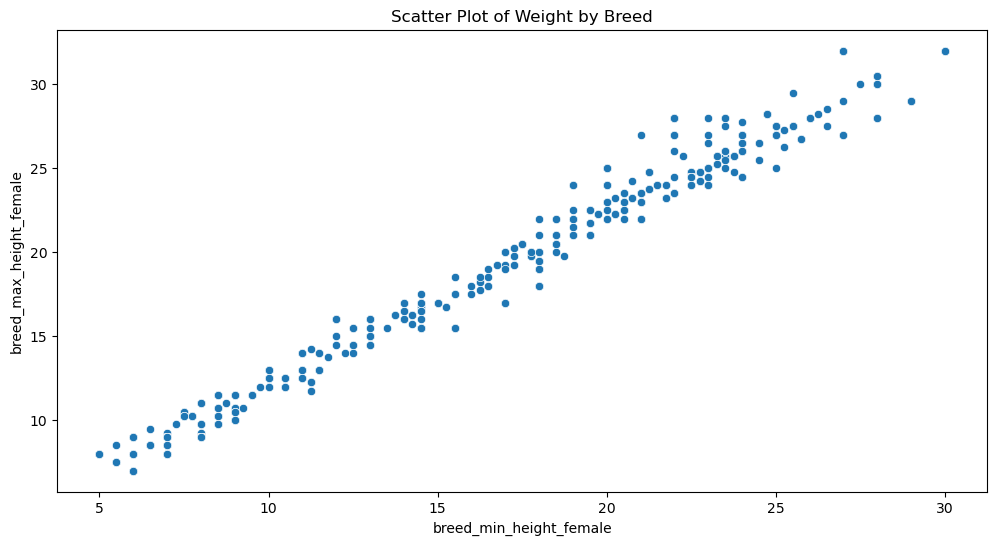

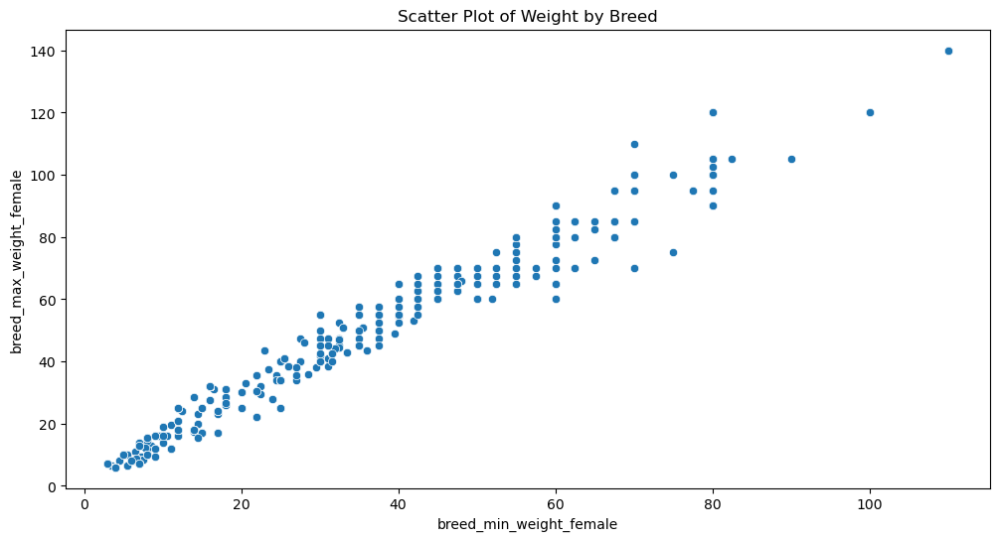

In [90]:

plt.figure(figsize=(12, 6))
sns.scatterplot(x=df['breed_min_height_female'], y=df['breed_max_height_female'])
plt.xlabel('breed_min_height_female')
plt.ylabel('breed_max_height_female')
plt.title('Scatter Plot of Weight by Breed')
plt.show()


plt.figure(figsize=(12, 6))
sns.scatterplot(x=df['breed_min_weight_female'], y=df['breed_max_weight_female'])
plt.xlabel('breed_min_weight_female')
plt.ylabel('breed_max_weight_female')
plt.title('Scatter Plot of Weight by Breed')
plt.show()


In [91]:
df['breed_min_life_expectancy'].isnull().sum()

113

In [92]:
def fill_na_with_median(df, column_name, group_col='breed'):
    global_median = df[column_name].median()  

    return df[column_name].fillna(
        df.groupby(group_col)[column_name].transform('median').fillna(global_median)
    )

In [93]:
df['breed_min_life_expectancy2'] = fill_na_with_median(df, 'breed_min_life_expectancy')



In [94]:
print(df['breed_min_life_expectancy2'].isnull().sum())  

0


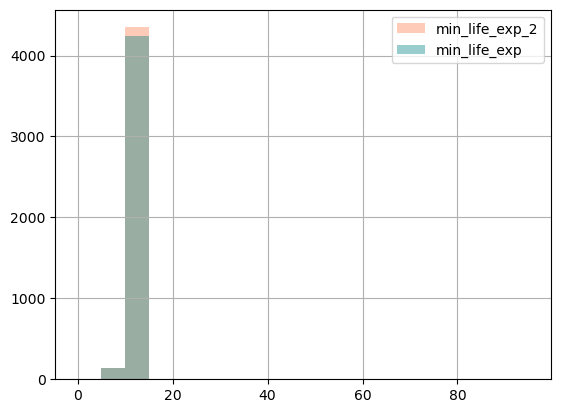

In [95]:
df['breed_min_life_expectancy2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='min_life_exp_2')
df['breed_min_life_expectancy'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='min_life_exp')
plt.legend()
plt.show()

In [96]:
df[['breed_min_life_expectancy2', 'breed_min_life_expectancy']].tail()



,breed_min_life_expectancy2,breed_min_life_expectancy
4482,12.0,NaN
4483,12.0,12.0
4484,12.0,NaN
4485,12.0,12.0
4486,12.0,12.0


In [97]:
df['breed_max_life_expectancy2'] = fill_na_with_median(df, 'breed_max_life_expectancy')
df['breed_max_weight_male2'] = fill_na_with_median(df, 'breed_max_weight_male')
df['breed_max_weight_female2'] = fill_na_with_median(df, 'breed_max_weight_female')
df['breed_max_height_male2'] = fill_na_with_median(df, 'breed_max_height_male')
df['breed_max_height_female2'] = fill_na_with_median(df, 'breed_max_height_female')
df['breed_min_height_male2'] = fill_na_with_median(df, 'breed_min_height_male')
df['breed_min_height_female2'] = fill_na_with_median(df, 'breed_min_height_female')
df['breed_min_weight_male2'] = fill_na_with_median(df, 'breed_min_weight_male')
df['breed_min_weight_female2'] = fill_na_with_median(df, 'breed_min_weight_female')


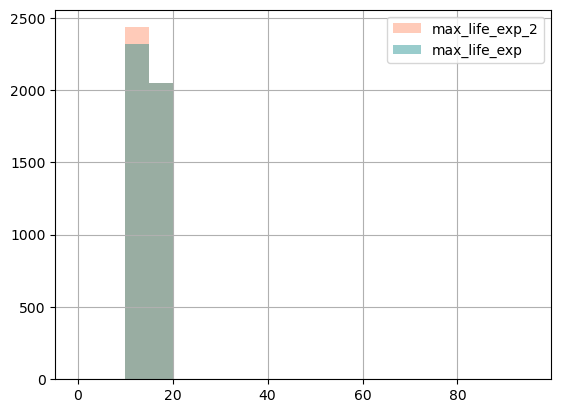

In [98]:
df['breed_max_life_expectancy2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='max_life_exp_2')
df['breed_max_life_expectancy'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='max_life_exp')
plt.legend()
plt.show()

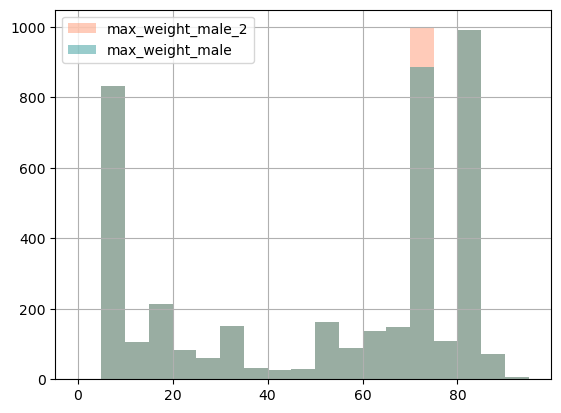

In [99]:
df['breed_max_weight_male2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='max_weight_male_2')
df['breed_max_weight_male'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='max_weight_male')
plt.legend()
plt.show()

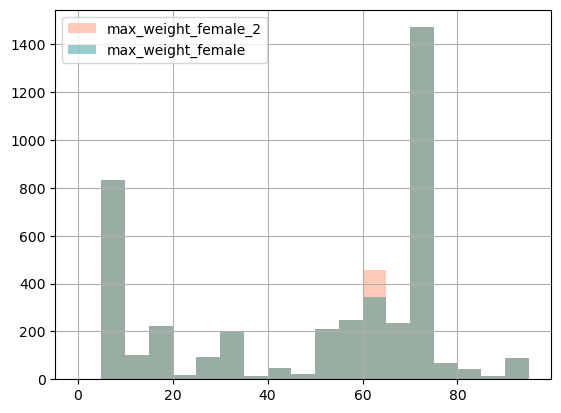

In [100]:
df['breed_max_weight_female2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='max_weight_female_2')
df['breed_max_weight_female'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='max_weight_female')
plt.legend()
plt.show()

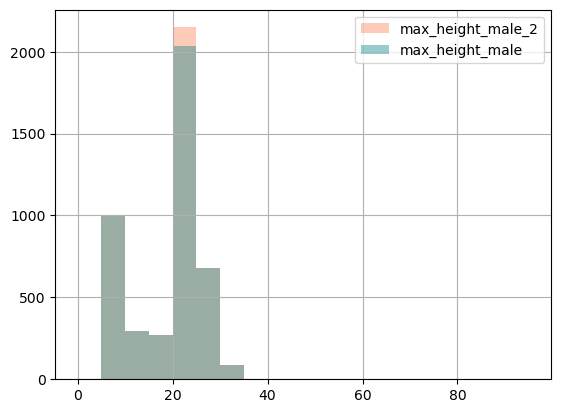

In [101]:
df['breed_max_height_male2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='max_height_male_2')
df['breed_max_height_male'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='max_height_male')
plt.legend()
plt.show()

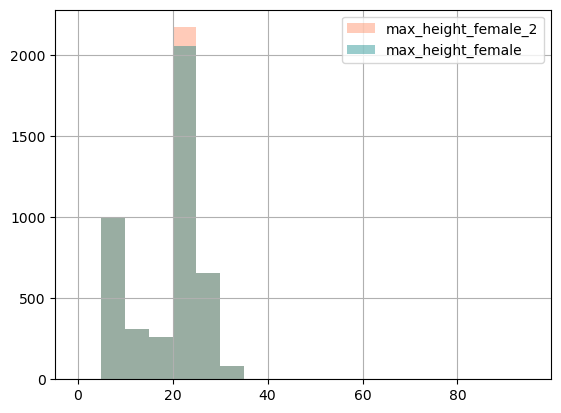

In [102]:
df['breed_max_height_female2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='max_height_female_2')
df['breed_max_height_female'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='max_height_female')
plt.legend()
plt.show()

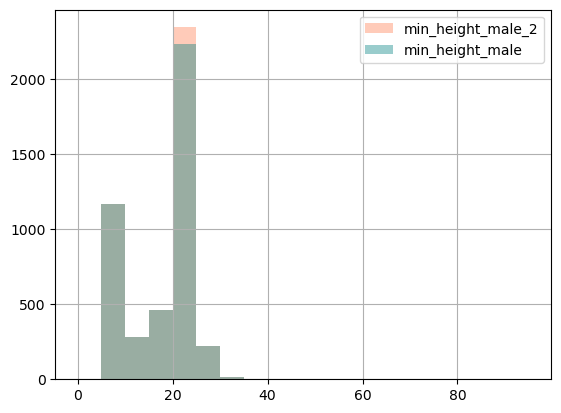

In [103]:
df['breed_min_height_male2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='min_height_male_2')
df['breed_min_height_male'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='min_height_male')
plt.legend()
plt.show()

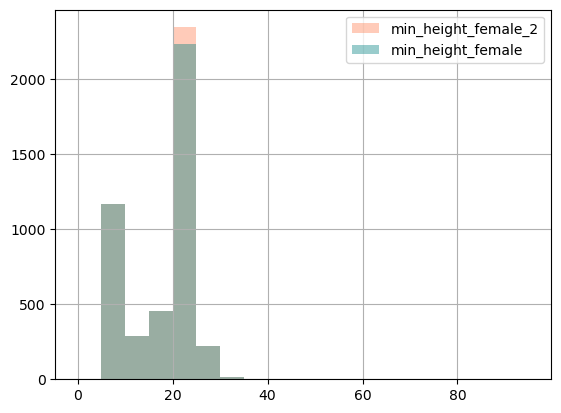

In [104]:
df['breed_min_height_female2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='min_height_female_2')
df['breed_min_height_female'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='min_height_female')
plt.legend()
plt.show()

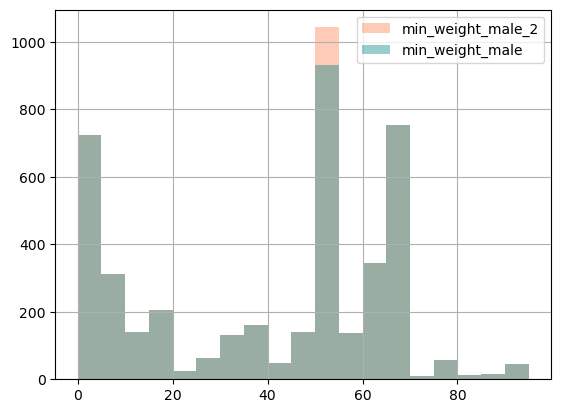

In [105]:
df['breed_min_weight_male2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='min_weight_male_2')
df['breed_min_weight_male'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='min_weight_male')
plt.legend()
plt.show()

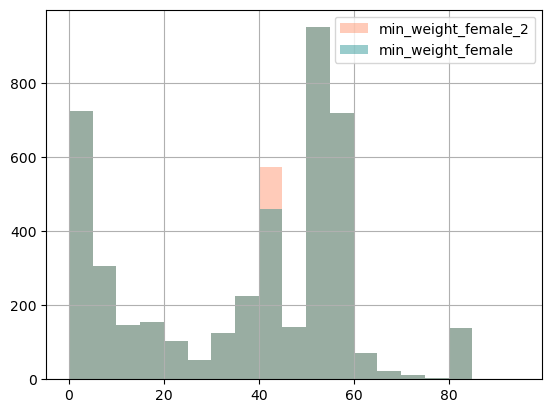

In [106]:
df['breed_min_weight_female2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='min_weight_female_2')
df['breed_min_weight_female'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='min_weight_female')
plt.legend()
plt.show()

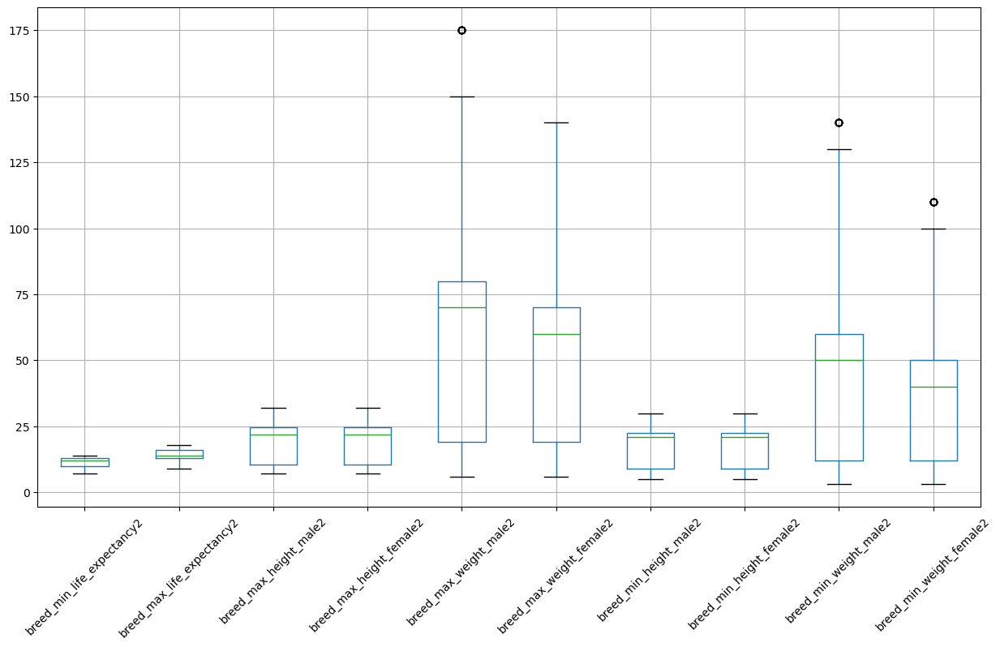

In [107]:
cols = ['breed_min_life_expectancy2', 'breed_max_life_expectancy2', 'breed_max_height_male2', 'breed_max_height_female2',
        'breed_max_weight_male2', 'breed_max_weight_female2', 'breed_min_height_male2', 'breed_min_height_female2',
        'breed_min_weight_male2', 'breed_min_weight_female2']

plt.figure(figsize=(15, 8))
df[cols].boxplot(rot=45) 
plt.show()


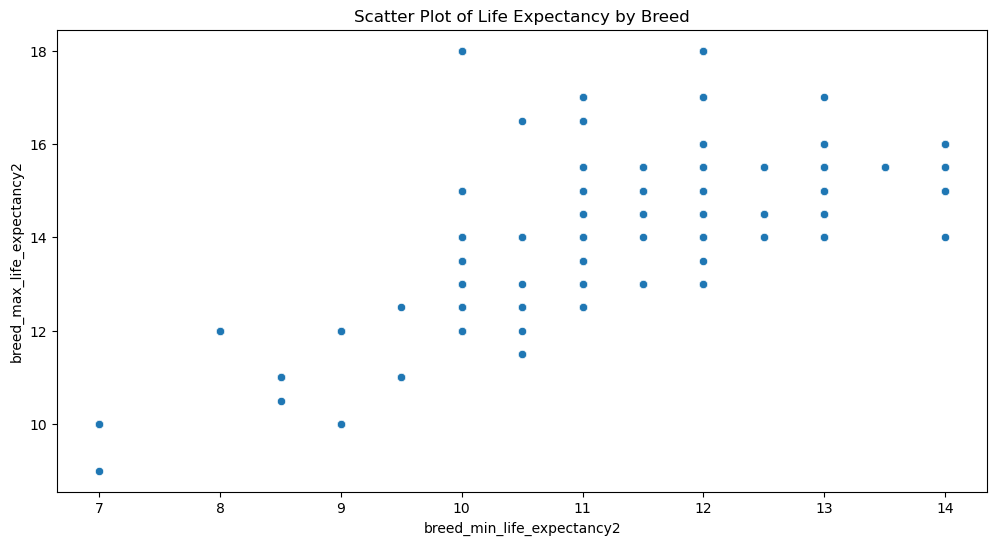

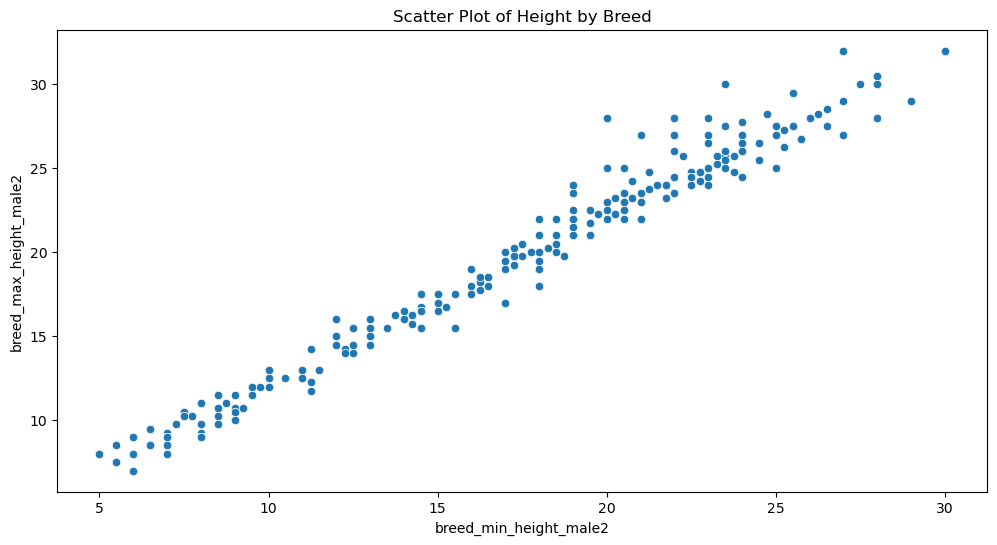

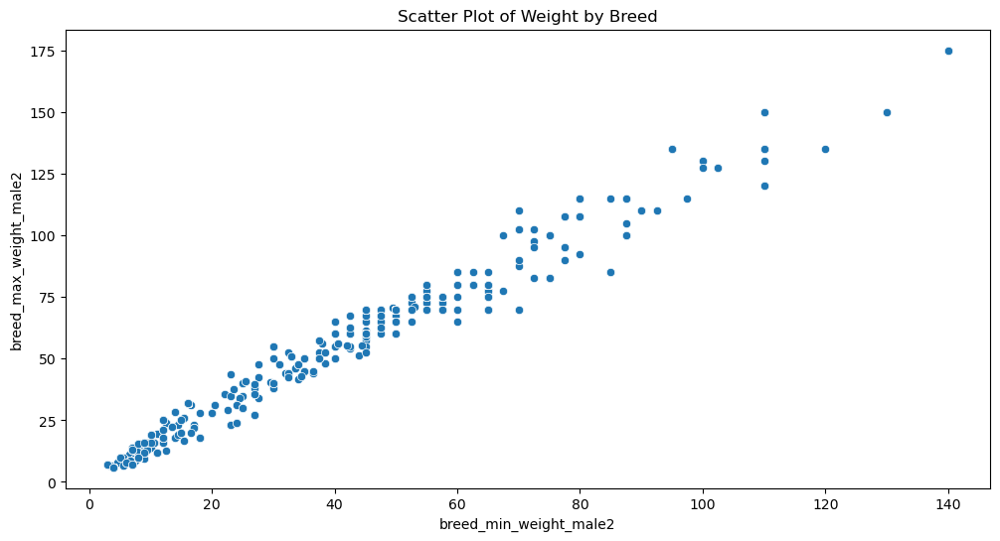

In [108]:


plt.figure(figsize=(12, 6))
sns.scatterplot(x=df['breed_min_life_expectancy2'], y=df['breed_max_life_expectancy2'])
plt.xlabel('breed_min_life_expectancy2')
plt.ylabel('breed_max_life_expectancy2')
plt.title('Scatter Plot of Life Expectancy by Breed')
plt.show()


plt.figure(figsize=(12, 6))
sns.scatterplot(x=df['breed_min_height_male2'], y=df['breed_max_height_male2'])
plt.xlabel('breed_min_height_male2')
plt.ylabel('breed_max_height_male2')
plt.title('Scatter Plot of Height by Breed')
plt.show()

plt.figure(figsize=(12, 6))
sns.scatterplot(x=df['breed_min_weight_male2'], y=df['breed_max_weight_male2'])
plt.xlabel('breed_min_weight_male2')
plt.ylabel('breed_max_weight_male2')
plt.title('Scatter Plot of Weight by Breed')
plt.show()



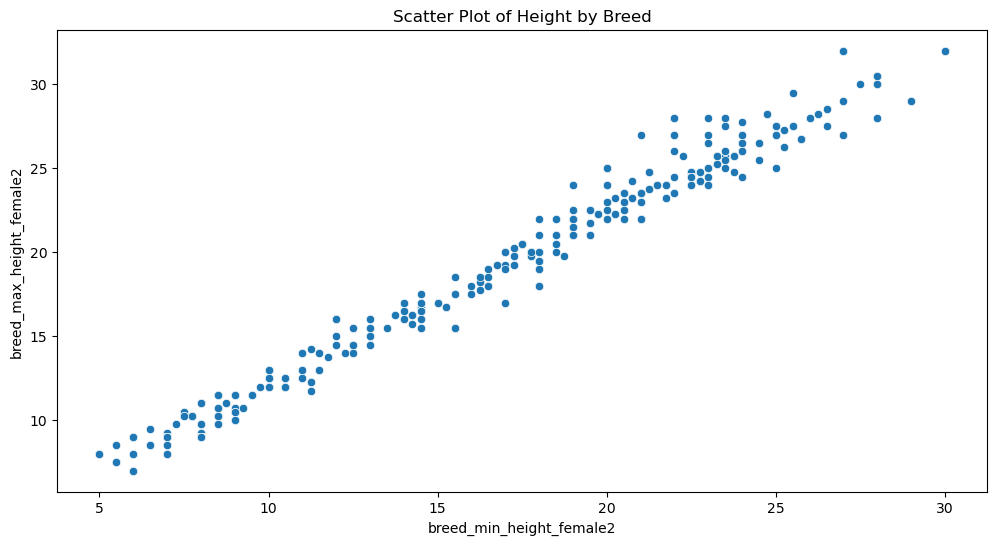

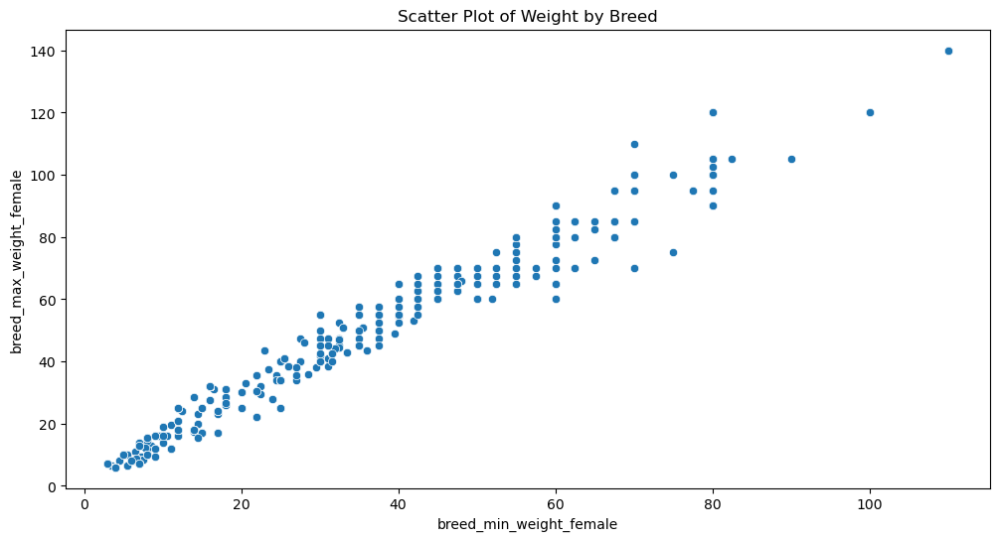

In [109]:

plt.figure(figsize=(12, 6))
sns.scatterplot(x=df['breed_min_height_female2'], y=df['breed_max_height_female2'])
plt.xlabel('breed_min_height_female2')
plt.ylabel('breed_max_height_female2')
plt.title('Scatter Plot of Height by Breed')
plt.show()


plt.figure(figsize=(12, 6))
sns.scatterplot(x=df['breed_min_weight_female2'], y=df['breed_max_weight_female2'])
plt.xlabel('breed_min_weight_female')
plt.ylabel('breed_max_weight_female')
plt.title('Scatter Plot of Weight by Breed')
plt.show()

*Possibili Outliers nei Boxplot*:

-Si notano dei valori anomali per le singole vairabili max_weight_male e min_weight_male e  min_weight_female rispetto alla  loro distribuzione

*Possibili Outliers negli Scatter Plot*:

Si notano valori anomali nelle relazioni tra le variabili:

*breed_min_life_expectancy vs breed_max_life_expectancy*

-Alcune razze presentano valori estremamente bassi o alti di aspettativa di vita che potrebbero essere dovuti all'appartenenza a una specifica razza. 
In generale la relazione tra l'aspettativa di vita minima e massima delle razze fa presuppore una relazione lineare tra le due variabili

*breed_min_height_male'vs breed_max_height_male/ breed_min_height_female vs breed_max_height_female :*

-La relazione tra altezza minima e massima sembra avere un andamento lineare positivo, i dati estremi potrebbero essere dovuti a cani di taglia eccessivamente grande e/o piccola


*breed_min_weight_male vs breed_max_weight_male* / *breed_min_weight_female vs breed_max_weight_male* :

-Ci sono anomalie nel peso, alcune razze di cani potrebbero avere un peso minimo vicino al peso massimo.




In [110]:
def is_outlier2(x, k=1.5):
    q1 = np.quantile(x, 0.25) 
    q3 = np.quantile(x, 0.75) 
    iqr = q3 - q1
    res = np.zeros(len(x), dtype=bool)
    for i, v in enumerate(x):
        if v < q1 - k * iqr or v > q3 + k * iqr:
            res[i] = True
    return res

In [111]:
df[is_outlier2(df['breed_max_weight_male2'], k=10)]

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2


In [112]:
df[is_outlier2(df['breed_min_weight_female2'], k=10)]

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2


In [113]:
df[is_outlier2(df['breed_min_weight_male2'], k=10)]

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2


I valori sono anomali sono fliers

In [114]:
def is_flier(x, low_percentile=1, high_percentile=99):
    q_low = np.percentile(x.dropna(), low_percentile) 
    q_high = np.percentile(x.dropna(), high_percentile)  
    return (x < q_low) | (x > q_high)


In [115]:
df[is_flier(df['breed_max_weight_male2'])]

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
137,2014-05-31,Partner,Transfer,Neutered Male,2015-06-04 17:05:00,Great Dane Mix,Blue,Silent Harbor Loop in Pflugerville (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
234,2015-01-12,Partner,Transfer,Intact Male,2015-08-19 13:48:00,Great Dane Mix,Black/White,56Th And Martin in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
1472,2014-05-05,Partner,Transfer,Neutered Male,2014-11-09 16:35:00,Great Dane Mix,Black/White,Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
1810,2016-04-25,Partner,Transfer,Intact Female,2016-06-26 21:48:00,Great Dane Mix,Black/White,2312 Peppertree Ct in Austin (TX),Normal,Owner Surrender,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2227,2012-08-14,Partner,Transfer,Neutered Male,2017-04-10 17:09:00,Great Dane Mix,Black/White,7600 Metropolis Dr in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2238,2010-06-27,Partner,Transfer,Spayed Female,2015-01-01 14:53:00,Great Dane,Black,Secluded Holllow And Council Bluff in Austin (TX),Injured,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2337,2012-06-14,Foster,Adoption,Neutered Male,2017-02-02 12:19:00,Great Dane Mix,Black/Brown,9401 S Hwy 183 in Travis (TX),Injured,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2342,2007-03-18,Partner,Transfer,Neutered Male,2016-06-10 19:52:00,Great Dane Mix,White/Black,9323 Manchaca Rd in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2433,2016-12-23,Partner,Transfer,Intact Male,2017-09-29 14:29:00,Great Dane/Pointer,Black/White,Outside Jurisdiction,Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2493,2011-08-20,Partner,Transfer,Spayed Female,2016-08-25 16:43:00,Great Dane Mix,White/Black,12349 Metric Blvd in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0


In [116]:
filtered_df = df[is_flier(df['breed_max_weight_female2'])]
breed_names = filtered_df['breed'].unique()
print(breed_names)

['Great Dane Mix' 'Great Dane' 'Great Dane/Pointer']


In [117]:
df[is_flier(df['breed_min_weight_male2'])]



,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
3,2006-10-22,Partner,Transfer,Neutered Male,2015-10-28 14:12:00,Pomeranian Mix,White/Black,9415 Rowlands Sayle Rd in Austin (TX),Normal,Stray,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0
29,2012-07-14,Partner,Transfer,Neutered Male,2016-07-14 17:03:00,Pomeranian,White,Austin (TX),Normal,Owner Surrender,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0
137,2014-05-31,Partner,Transfer,Neutered Male,2015-06-04 17:05:00,Great Dane Mix,Blue,Silent Harbor Loop in Pflugerville (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
149,2014-02-16,Partner,Transfer,Intact Male,2014-03-27 08:00:00,Pomeranian Mix,White/Brown,Us 290 & Ridgepoint Dr in Austin (TX),Normal,Stray,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0
234,2015-01-12,Partner,Transfer,Intact Male,2015-08-19 13:48:00,Great Dane Mix,Black/White,56Th And Martin in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
430,2015-04-27,Partner,Transfer,Intact Female,2017-04-29 16:13:00,Pomeranian Mix,Black,Austin (TX),Normal,Owner Surrender,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0
431,2016-09-28,Partner,Transfer,Intact Male,2016-11-29 00:00:00,Chihuahua Shorthair/Pomeranian,Black,Travis (TX),Normal,Owner Surrender,...,13.0,16.0,6.5,6.5,7.5,7.5,5.5,5.5,3.5,3.5
531,2015-03-26,Partner,Transfer,Intact Male,2015-05-30 15:18:00,Newfoundland Mix,Black/White,183 Access Near 45 in Austin (TX),Normal,Stray,...,9.0,10.0,150.0,120.0,28.0,28.0,28.0,28.0,130.0,100.0
763,2008-03-22,Partner,Transfer,Spayed Female,2015-03-26 16:11:00,Pomeranian,Red,Jamie Dr And Joy Lee Ln in Austin (TX),Normal,Stray,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0
895,2011-02-26,Partner,Transfer,Spayed Female,2014-03-08 13:45:00,Newfoundland/Great Pyrenees,Sable,Austin (TX),Normal,Owner Surrender,...,9.5,11.0,135.0,105.0,30.0,30.0,27.5,27.5,120.0,90.0


In [118]:
filtered_df = df[is_flier(df['breed_min_weight_male2'])]
breed_names = filtered_df['breed'].unique()
print(breed_names)

['Pomeranian Mix' 'Pomeranian' 'Great Dane Mix'
 'Chihuahua Shorthair/Pomeranian' 'Newfoundland Mix'
 'Newfoundland/Great Pyrenees' 'Chihuahua Longhair/Pomeranian'
 'Pomeranian/Jack Russell Terrier' 'Pomeranian/Chihuahua Shorthair'
 'Great Dane' 'Great Dane/Pointer' 'Pomeranian/Chihuahua Longhair']


In [119]:
df[is_flier(df['breed_min_weight_female2'])]

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
3,2006-10-22,Partner,Transfer,Neutered Male,2015-10-28 14:12:00,Pomeranian Mix,White/Black,9415 Rowlands Sayle Rd in Austin (TX),Normal,Stray,...,12.0,16.0,7.0,7.0,7.00,7.00,6.00,6.00,3.0,3.0
29,2012-07-14,Partner,Transfer,Neutered Male,2016-07-14 17:03:00,Pomeranian,White,Austin (TX),Normal,Owner Surrender,...,12.0,16.0,7.0,7.0,7.00,7.00,6.00,6.00,3.0,3.0
137,2014-05-31,Partner,Transfer,Neutered Male,2015-06-04 17:05:00,Great Dane Mix,Blue,Silent Harbor Loop in Pflugerville (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.00,32.00,30.00,30.00,140.0,110.0
149,2014-02-16,Partner,Transfer,Intact Male,2014-03-27 08:00:00,Pomeranian Mix,White/Brown,Us 290 & Ridgepoint Dr in Austin (TX),Normal,Stray,...,12.0,16.0,7.0,7.0,7.00,7.00,6.00,6.00,3.0,3.0
234,2015-01-12,Partner,Transfer,Intact Male,2015-08-19 13:48:00,Great Dane Mix,Black/White,56Th And Martin in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.00,32.00,30.00,30.00,140.0,110.0
430,2015-04-27,Partner,Transfer,Intact Female,2017-04-29 16:13:00,Pomeranian Mix,Black,Austin (TX),Normal,Owner Surrender,...,12.0,16.0,7.0,7.0,7.00,7.00,6.00,6.00,3.0,3.0
431,2016-09-28,Partner,Transfer,Intact Male,2016-11-29 00:00:00,Chihuahua Shorthair/Pomeranian,Black,Travis (TX),Normal,Owner Surrender,...,13.0,16.0,6.5,6.5,7.50,7.50,5.50,5.50,3.5,3.5
531,2015-03-26,Partner,Transfer,Intact Male,2015-05-30 15:18:00,Newfoundland Mix,Black/White,183 Access Near 45 in Austin (TX),Normal,Stray,...,9.0,10.0,150.0,120.0,28.00,28.00,28.00,28.00,130.0,100.0
763,2008-03-22,Partner,Transfer,Spayed Female,2015-03-26 16:11:00,Pomeranian,Red,Jamie Dr And Joy Lee Ln in Austin (TX),Normal,Stray,...,12.0,16.0,7.0,7.0,7.00,7.00,6.00,6.00,3.0,3.0
895,2011-02-26,Partner,Transfer,Spayed Female,2014-03-08 13:45:00,Newfoundland/Great Pyrenees,Sable,Austin (TX),Normal,Owner Surrender,...,9.5,11.0,135.0,105.0,30.00,30.00,27.50,27.50,120.0,90.0


In [120]:
filtered_df = df[is_flier(df['breed_min_weight_female2'])]
breed_names = filtered_df['breed'].unique()
print(breed_names)


['Pomeranian Mix' 'Pomeranian' 'Great Dane Mix'
 'Chihuahua Shorthair/Pomeranian' 'Newfoundland Mix'
 'Newfoundland/Great Pyrenees' 'Chihuahua Longhair/Pomeranian'
 'Pomeranian/Jack Russell Terrier' 'Great Dane/Labrador Retriever'
 'Pomeranian/Chihuahua Shorthair' 'Great Dane' 'Great Dane/Pointer'
 'Pomeranian/Chihuahua Longhair' 'Bullmastiff Mix']


In [121]:
df_great_dane_mix = df[df['breed'] == 'Great Dane Mix'] 

In [122]:
df_great_dane_mix.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
137,2014-05-31,Partner,Transfer,Neutered Male,2015-06-04 17:05:00,Great Dane Mix,Blue,Silent Harbor Loop in Pflugerville (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
234,2015-01-12,Partner,Transfer,Intact Male,2015-08-19 13:48:00,Great Dane Mix,Black/White,56Th And Martin in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
1472,2014-05-05,Partner,Transfer,Neutered Male,2014-11-09 16:35:00,Great Dane Mix,Black/White,Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
1810,2016-04-25,Partner,Transfer,Intact Female,2016-06-26 21:48:00,Great Dane Mix,Black/White,2312 Peppertree Ct in Austin (TX),Normal,Owner Surrender,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2227,2012-08-14,Partner,Transfer,Neutered Male,2017-04-10 17:09:00,Great Dane Mix,Black/White,7600 Metropolis Dr in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0


In [123]:
df_great_dane = df[df['breed'] == 'Great Dane'] 

In [124]:
df_great_dane.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
2238,2010-06-27,Partner,Transfer,Spayed Female,2015-01-01 14:53:00,Great Dane,Black,Secluded Holllow And Council Bluff in Austin (TX),Injured,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2645,2008-12-01,Partner,Transfer,Spayed Female,2013-12-02 14:10:00,Great Dane,Black/White,Norman Trl in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
3272,2016-12-29,Partner,Transfer,Intact Male,2017-03-30 18:43:00,Great Dane,White/Red,969 And Hwy 183 in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
4404,2011-11-09,Unknown,Return to Owner,Neutered Male,2015-11-09 17:54:00,Great Dane,Black/White,22325 Rocking A Trl in Travis (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0


In [125]:
df_great_dane_pointer = df[df['breed'] == 'Great Dane/Pointer'] 

In [126]:
df_great_dane_pointer.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
2433,2016-12-23,Partner,Transfer,Intact Male,2017-09-29 14:29:00,Great Dane/Pointer,Black/White,Outside Jurisdiction,Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0


In [127]:
df_pomeriana= df[df['breed'] == 'Pomeranian']  

In [128]:
df_pomeriana.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
29,2012-07-14,Partner,Transfer,Neutered Male,2016-07-14 17:03:00,Pomeranian,White,Austin (TX),Normal,Owner Surrender,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0
763,2008-03-22,Partner,Transfer,Spayed Female,2015-03-26 16:11:00,Pomeranian,Red,Jamie Dr And Joy Lee Ln in Austin (TX),Normal,Stray,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0
1163,2011-01-23,Partner,Transfer,Neutered Male,2016-01-25 13:59:00,Pomeranian,Black/White,Beechmoor And Basswood in Austin (TX),Normal,Stray,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0
1286,2004-07-05,Suffering,Euthanasia,Intact Male,2014-07-05 14:21:00,Pomeranian,Red,144 Escondido Dr in Del Valle (TX),Normal,Stray,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0
2758,2012-12-11,Partner,Transfer,Intact Female,2013-12-17 17:54:00,Pomeranian,Red,5501 Peppertree in Austin (TX),Injured,Stray,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0


In [129]:
df_pomeriana_mix= df[df['breed'] == 'Pomeranian Mix']

In [130]:
df_pomeriana_mix.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
3,2006-10-22,Partner,Transfer,Neutered Male,2015-10-28 14:12:00,Pomeranian Mix,White/Black,9415 Rowlands Sayle Rd in Austin (TX),Normal,Stray,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0
149,2014-02-16,Partner,Transfer,Intact Male,2014-03-27 08:00:00,Pomeranian Mix,White/Brown,Us 290 & Ridgepoint Dr in Austin (TX),Normal,Stray,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0
430,2015-04-27,Partner,Transfer,Intact Female,2017-04-29 16:13:00,Pomeranian Mix,Black,Austin (TX),Normal,Owner Surrender,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0
1703,2013-12-07,Partner,Transfer,Spayed Female,2015-12-08 16:10:00,Pomeranian Mix,Buff,Austin (TX),Normal,Owner Surrender,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0
2204,2006-11-12,Partner,Transfer,Neutered Male,2014-11-16 17:29:00,Pomeranian Mix,Tan/White,Slaughter And Manchaca in Austin (TX),Normal,Stray,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0


In [131]:
df_pomeriana_chihu_pom= df[df['breed'] == 'Chihuahua Shorthair/Pomeranian']

In [132]:
df_pomeriana_chihu_pom.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
431,2016-09-28,Partner,Transfer,Intact Male,2016-11-29 00:00:00,Chihuahua Shorthair/Pomeranian,Black,Travis (TX),Normal,Owner Surrender,...,13.0,16.0,6.5,6.5,7.5,7.5,5.5,5.5,3.5,3.5
1007,2015-05-05,Partner,Transfer,Neutered Male,2015-11-23 13:19:00,Chihuahua Shorthair/Pomeranian,Cream/White,4904 Merrict Cir in Austin (TX),Injured,Stray,...,13.0,16.0,6.5,6.5,7.5,7.5,5.5,5.5,3.5,3.5
3759,2014-03-07,Foster,Adoption,Neutered Male,2014-05-26 19:10:00,Chihuahua Shorthair/Pomeranian,Black,Austin (TX),Sick,Owner Surrender,...,13.0,16.0,6.5,6.5,7.5,7.5,5.5,5.5,3.5,3.5


In [133]:
df_newfound_mix= df[df['breed'] == 'Newfoundland Mix']

In [134]:
df_newfound_mix.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
531,2015-03-26,Partner,Transfer,Intact Male,2015-05-30 15:18:00,Newfoundland Mix,Black/White,183 Access Near 45 in Austin (TX),Normal,Stray,...,9.0,10.0,150.0,120.0,28.0,28.0,28.0,28.0,130.0,100.0
2279,2012-06-24,Partner,Transfer,Intact Male,2014-06-29 17:08:00,Newfoundland Mix,Black,Schriber Rd in Travis (TX),Normal,Stray,...,9.0,10.0,150.0,120.0,28.0,28.0,28.0,28.0,130.0,100.0


In [135]:
df_newfound_pyr= df[df['breed'] == 'Newfoundland/Great Pyrenees'] #uno solo 

In [136]:
df_newfound_pyr.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
895,2011-02-26,Partner,Transfer,Spayed Female,2014-03-08 13:45:00,Newfoundland/Great Pyrenees,Sable,Austin (TX),Normal,Owner Surrender,...,9.5,11.0,135.0,105.0,30.0,30.0,27.5,27.5,120.0,90.0


In [137]:
df_chi_long_pom= df[df['breed'] == 'Chihuahua Longhair/Pomeranian']

In [138]:
df_chi_long_pom.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
942,2016-09-28,Partner,Transfer,Intact Male,2016-11-29 00:00:00,Chihuahua Longhair/Pomeranian,Black,Travis (TX),Normal,Owner Surrender,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0
2202,2015-12-17,Partner,Transfer,Neutered Male,2016-12-21 16:49:00,Chihuahua Longhair/Pomeranian,White/Tan,3930 Bee Caves in Travis (TX),Normal,Stray,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0


In [139]:
df_pom_jack=df[df['breed'] == 'Pomeranian/Jack Russell Terrier'] 

In [140]:
df_pom_jack.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
1046,2011-04-30,Offsite,Adoption,Spayed Female,2014-05-03 07:43:00,Pomeranian/Jack Russell Terrier,Tan,7201 Woodhollow Dr in Austin (TX),Normal,Owner Surrender,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0


In [141]:
df_pom_chi_sho=df[df['breed'] == 'Pomeranian/Chihuahua Shorthair'] 

In [142]:
df_pom_chi_sho.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
1520,2010-09-08,Partner,Transfer,Intact Female,2016-09-21 16:34:00,Pomeranian/Chihuahua Shorthair,Tan/White,9422 Brown Ln in Austin (TX),Normal,Stray,...,13.0,16.0,6.5,6.5,7.5,7.5,5.5,5.5,3.5,3.5
2234,2013-02-13,Partner,Transfer,Intact Female,2015-10-16 12:14:00,Pomeranian/Chihuahua Shorthair,Buff,Delano & Hudson in Austin (TX),Normal,Stray,...,13.0,16.0,6.5,6.5,7.5,7.5,5.5,5.5,3.5,3.5


In [143]:
df_pom_chi_long=df[df['breed'] == 'Pomeranian/Chihuahua Longhair'] 

In [144]:
df_pom_chi_long.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
2465,2016-02-15,Partner,Transfer,Neutered Male,2017-02-19 16:35:00,Pomeranian/Chihuahua Longhair,Red/Tan,100 Montopolis Dr in Austin (TX),Normal,Stray,...,12.0,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0


Alcuni cani come Great Dane/Labrador Retriever sono presenti con un solo esemplare

In [145]:
df_great_dane_labrador=df[df['breed'] == 'Great Dane/Labrador Retriever']

In [146]:
df_great_dane_labrador.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
1227,2013-02-02,Partner,Transfer,Spayed Female,2013-10-19 17:43:00,Great Dane/Labrador Retriever,Black/White,Austin (TX),Normal,Owner Surrender,...,8.5,11.0,127.5,105.0,28.25,28.25,26.25,26.25,102.5,82.5


In [147]:
df_bulstaff_mix=df[df['breed'] == 'Bullmastiff Mix'] 


In [148]:
df_bulstaff_mix.head()
  


,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
4186,2005-02-21,Unknown,Return to Owner,Spayed Female,2014-06-30 17:34:00,Bullmastiff Mix,Black,12221 N Mopac in Austin (TX),Normal,Public Assist,...,7.0,9.0,130.0,120.0,27.0,27.0,25.0,25.0,110.0,100.0


Considerando che i pesi sono in libbre (pounds) ha senso che i cani di taglia piccola come 
i Pomeranian, Pomeranian Mix e i Chihuahua Shorthair/Pomeranian abbiano un peso minimo maschi intorno ai 3 pounds  e un massimo intorno ai 7 pounds sia peri maschi che per le femmine essendo di taglia piccola e razza mista. 

Lo stesso vale per i  Great Dane e Great Dane Mix maschi che hanno un peso minimo di 140 pounds e massimo 175 pounds e per i  Great Dane Pointer 110 e 130  essendo tutti cani di grande taglia. 
Lo stesso vale per i Newfoundland Mix che sono di taglia grande e per i pesi minimi dei cani femmina che so no realisticamente coerenti con la taglia della razza alla quale appartengono.

Alcuni valori potrebbero essere fliers perchè c'è una scarsa rappresentatività per alcune razze come Bullmastiff Mix, Great Dane/Labrador Retriever che sono presenti con un solo record.




In [149]:
df.columns

Index(['date_of_birth', 'outcome_subtype', 'outcome_type', 'sex_upon_outcome',
       'outcome_datetime', 'breed', 'color', 'found_location',
       'intake_condition', 'intake_type', 'sex_upon_intake', 'count',
       'intake_datetime', 'breed_min_life_expectancy',
       'breed_max_life_expectancy', 'breed_max_height_male',
       'breed_max_height_female', 'breed_max_weight_male',
       'breed_max_weight_female', 'breed_min_height_male',
       'breed_min_height_female', 'breed_min_weight_male',
       'breed_min_weight_female', 'good_with_children', 'good_with_other_dogs',
       'shedding', 'grooming', 'drooling', 'coat_length',
       'good_with_strangers', 'playfulness', 'protectiveness', 'trainability',
       'energy', 'barking', 'breed_category', 'age_upon_intake',
       'age_upon_outcome', 'Apricot', 'Black', 'Black Brindle', 'Black Smoke',
       'Blue', 'Blue Cream', 'Blue Merle', 'Blue Tick', 'Blue Tiger', 'Brown',
       'Brown Brindle', 'Brown Merle', 'Brown Tiger', '

In [150]:
df[is_outlier2(df['breed_max_height_male2'], k=10)]

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2


In [151]:
df[is_outlier2(df['breed_max_height_male2'], k=10)]

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2


In [152]:
df[is_outlier2(df['breed_max_height_female2'], k=10)]

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2


In [153]:
df[is_outlier2(df['breed_min_height_male2'], k=10)]

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2


In [154]:
df[is_outlier2(df['breed_min_height_female2'], k=10)]

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2


In [155]:
df[is_outlier2(df['breed_max_life_expectancy2'], k=10)]

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2


In [156]:
df[is_outlier2(df['breed_min_life_expectancy2'], k=10)]

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2


In [157]:
df[is_flier(df['breed_min_life_expectancy2'])]

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
137,2014-05-31,Partner,Transfer,Neutered Male,2015-06-04 17:05:00,Great Dane Mix,Blue,Silent Harbor Loop in Pflugerville (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
234,2015-01-12,Partner,Transfer,Intact Male,2015-08-19 13:48:00,Great Dane Mix,Black/White,56Th And Martin in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
1080,2012-12-23,Partner,Transfer,Neutered Male,2017-10-19 12:33:00,Bernese Mountain Dog Mix,Tricolor/Brown,4508 Merle in Austin (TX),Normal,Owner Surrender,...,7.0,10.0,115.0,95.0,27.5,27.5,25.0,25.0,80.0,70.0
1472,2014-05-05,Partner,Transfer,Neutered Male,2014-11-09 16:35:00,Great Dane Mix,Black/White,Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
1764,2012-12-23,Partner,Transfer,Neutered Male,2017-09-26 00:00:00,Bernese Mountain Dog Mix,Tricolor/Brown,Austin (TX),Normal,Owner Surrender,...,7.0,10.0,115.0,95.0,27.5,27.5,25.0,25.0,80.0,70.0
1810,2016-04-25,Partner,Transfer,Intact Female,2016-06-26 21:48:00,Great Dane Mix,Black/White,2312 Peppertree Ct in Austin (TX),Normal,Owner Surrender,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2192,2014-04-13,Partner,Transfer,Intact Female,2014-05-13 15:19:00,Bernese Mountain Dog,Tricolor,8543 Adirondack Trl in Austin (TX),Normal,Stray,...,7.0,10.0,115.0,95.0,27.5,27.5,25.0,25.0,80.0,70.0
2227,2012-08-14,Partner,Transfer,Neutered Male,2017-04-10 17:09:00,Great Dane Mix,Black/White,7600 Metropolis Dr in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2238,2010-06-27,Partner,Transfer,Spayed Female,2015-01-01 14:53:00,Great Dane,Black,Secluded Holllow And Council Bluff in Austin (TX),Injured,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2337,2012-06-14,Foster,Adoption,Neutered Male,2017-02-02 12:19:00,Great Dane Mix,Black/Brown,9401 S Hwy 183 in Travis (TX),Injured,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0


In precedenza è emerso  che nel dataset c'è un solo esemplare di Bullmastiff Mix

In [158]:
df[is_flier(df['breed_max_life_expectancy2'])] 

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
4186,2005-02-21,Unknown,Return to Owner,Spayed Female,2014-06-30 17:34:00,Bullmastiff Mix,Black,12221 N Mopac in Austin (TX),Normal,Public Assist,...,7.0,9.0,130.0,120.0,27.0,27.0,25.0,25.0,110.0,100.0


In [159]:
df_bernese= df[df['breed'] == 'Bernese Mountain Dog Mix']  

In [160]:
df_bernese.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
1080,2012-12-23,Partner,Transfer,Neutered Male,2017-10-19 12:33:00,Bernese Mountain Dog Mix,Tricolor/Brown,4508 Merle in Austin (TX),Normal,Owner Surrender,...,7.0,10.0,115.0,95.0,27.5,27.5,25.0,25.0,80.0,70.0
1764,2012-12-23,Partner,Transfer,Neutered Male,2017-09-26 00:00:00,Bernese Mountain Dog Mix,Tricolor/Brown,Austin (TX),Normal,Owner Surrender,...,7.0,10.0,115.0,95.0,27.5,27.5,25.0,25.0,80.0,70.0
3873,2017-08-06,Partner,Transfer,Intact Female,2017-08-21 12:20:00,Bernese Mountain Dog Mix,Sable/White,8409 Leeds Mountain Cv in Austin (TX),Nursing,Stray,...,7.0,10.0,115.0,95.0,27.5,27.5,25.0,25.0,80.0,70.0


In [161]:
df[is_flier(df['breed_min_height_male2'])]

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
137,2014-05-31,Partner,Transfer,Neutered Male,2015-06-04 17:05:00,Great Dane Mix,Blue,Silent Harbor Loop in Pflugerville (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
234,2015-01-12,Partner,Transfer,Intact Male,2015-08-19 13:48:00,Great Dane Mix,Black/White,56Th And Martin in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
1472,2014-05-05,Partner,Transfer,Neutered Male,2014-11-09 16:35:00,Great Dane Mix,Black/White,Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
1810,2016-04-25,Partner,Transfer,Intact Female,2016-06-26 21:48:00,Great Dane Mix,Black/White,2312 Peppertree Ct in Austin (TX),Normal,Owner Surrender,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2227,2012-08-14,Partner,Transfer,Neutered Male,2017-04-10 17:09:00,Great Dane Mix,Black/White,7600 Metropolis Dr in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2238,2010-06-27,Partner,Transfer,Spayed Female,2015-01-01 14:53:00,Great Dane,Black,Secluded Holllow And Council Bluff in Austin (TX),Injured,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2337,2012-06-14,Foster,Adoption,Neutered Male,2017-02-02 12:19:00,Great Dane Mix,Black/Brown,9401 S Hwy 183 in Travis (TX),Injured,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2342,2007-03-18,Partner,Transfer,Neutered Male,2016-06-10 19:52:00,Great Dane Mix,White/Black,9323 Manchaca Rd in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2433,2016-12-23,Partner,Transfer,Intact Male,2017-09-29 14:29:00,Great Dane/Pointer,Black/White,Outside Jurisdiction,Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2493,2011-08-20,Partner,Transfer,Spayed Female,2016-08-25 16:43:00,Great Dane Mix,White/Black,12349 Metric Blvd in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0


In [162]:
df[is_flier(df['breed_min_height_female2'])]

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_min_life_expectancy2,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2
137,2014-05-31,Partner,Transfer,Neutered Male,2015-06-04 17:05:00,Great Dane Mix,Blue,Silent Harbor Loop in Pflugerville (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
234,2015-01-12,Partner,Transfer,Intact Male,2015-08-19 13:48:00,Great Dane Mix,Black/White,56Th And Martin in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
1472,2014-05-05,Partner,Transfer,Neutered Male,2014-11-09 16:35:00,Great Dane Mix,Black/White,Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
1810,2016-04-25,Partner,Transfer,Intact Female,2016-06-26 21:48:00,Great Dane Mix,Black/White,2312 Peppertree Ct in Austin (TX),Normal,Owner Surrender,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2227,2012-08-14,Partner,Transfer,Neutered Male,2017-04-10 17:09:00,Great Dane Mix,Black/White,7600 Metropolis Dr in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2238,2010-06-27,Partner,Transfer,Spayed Female,2015-01-01 14:53:00,Great Dane,Black,Secluded Holllow And Council Bluff in Austin (TX),Injured,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2337,2012-06-14,Foster,Adoption,Neutered Male,2017-02-02 12:19:00,Great Dane Mix,Black/Brown,9401 S Hwy 183 in Travis (TX),Injured,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2342,2007-03-18,Partner,Transfer,Neutered Male,2016-06-10 19:52:00,Great Dane Mix,White/Black,9323 Manchaca Rd in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2433,2016-12-23,Partner,Transfer,Intact Male,2017-09-29 14:29:00,Great Dane/Pointer,Black/White,Outside Jurisdiction,Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0
2493,2011-08-20,Partner,Transfer,Spayed Female,2016-08-25 16:43:00,Great Dane Mix,White/Black,12349 Metric Blvd in Austin (TX),Normal,Stray,...,7.0,10.0,175.0,140.0,32.0,32.0,30.0,30.0,140.0,110.0


Per i valori dell'aspettativa di vita massima e minima e dell'altezza massima e minima per entrambi i sessi vale il discorso della scarsa rappresentatività di alcune razze nel dataset e il fatto che i flier corrispondono a razze di taglia  estremamente grande e/o piccola. 

Si potrebbe indagare il rapporto tra aspettative di vita e razza e creare una variabile sulla taglia per capire se influenza le altre variabili.

Non sono presenti dati duplicati

In [163]:
df.duplicated().sum()

0

## Data Engineering
- are there other variables that you could create?
    - dog's age
    - lenght of stay
    - is the dog mixed breed? CREATA NELLA SEZIONE PRECEDENTE
    - ...
- *transform variables. Do some variables need to be normalized? Should you one-hot encode some variables?*
    - from the data distribution step, you might have identified some variables that need to be transformed;
    - does it make sense to keep the color as numerical? would it be better to check all possile dog colors and create a binary column for each color?  CREATE NELLA SEZIONE PRECEDENTE PER COLORE E RAZZA 
- *plot pairwise correlation*
- *remove redundant variables*


In [164]:
df['dog_age'] = (df['outcome_datetime'] - df['date_of_birth']).dt.total_seconds() / (60 * 60 * 24 * 365)

In [165]:
df['dog_age'].head()

0    0.170753
1    0.191024
2    8.059412
3    9.023539
4    1.026486
Name: dog_age, dtype: float64

In [166]:
df.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_max_life_expectancy2,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2,dog_age
0,2017-03-08,Foster,Adoption,Intact Male,2017-05-09 07:48:00,Greyhound Mix,Tan,6016 Los Cielos in Travis (TX),Normal,Stray,...,13.0,70.0,65.0,30.0,30.0,28.0,28.0,65.0,60.0,0.170753
1,2016-07-03,Foster,Adoption,Spayed Female,2016-09-10 17:22:00,Boxer Mix,Brown/White,11719 Schiber Rd in Mustang Ridge (TX),Normal,Stray,...,12.0,80.0,65.0,25.0,25.0,23.0,23.0,65.0,50.0,0.191024
2,2010-02-10,Partner,Transfer,Intact Male,2018-03-01 16:27:00,Chihuahua Shorthair Mix,Red,2300 Scarborough in Austin (TX),Normal,Stray,...,16.0,6.0,6.0,8.0,8.0,5.0,5.0,4.0,4.0,8.059412
3,2006-10-22,Partner,Transfer,Neutered Male,2015-10-28 14:12:00,Pomeranian Mix,White/Black,9415 Rowlands Sayle Rd in Austin (TX),Normal,Stray,...,16.0,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0,9.023539
4,2016-09-07,Partner,Transfer,Spayed Female,2017-09-16 16:01:00,Shih Tzu Mix,White/Brown,3909 N Interstate 35 Service Rd in Austin (TX),Normal,Stray,...,18.0,16.0,16.0,10.5,10.5,9.0,9.0,9.0,9.0,1.026486


In [167]:
df['dog_age'].isnull().sum()

0

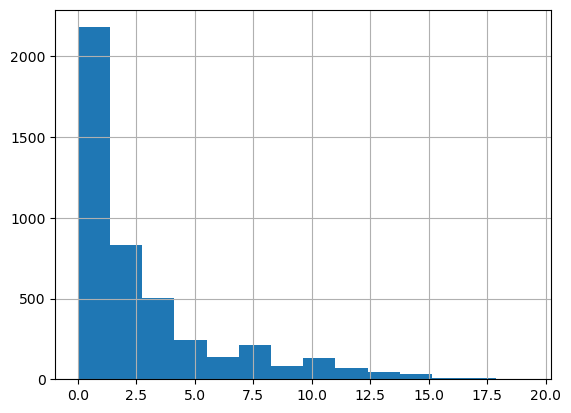

In [168]:
k = int(np.ceil(np.log2(len(df)) + 1))
df['dog_age'].hist(bins=k)
plt.show()    

 dog_age presenta una Distribuzione asimmetrica con skewness positiva

In [169]:
df['length_of_stay'] = (df['outcome_datetime'] - df['intake_datetime']).dt.total_seconds() / (60 * 60 * 24 * 365)

In [170]:
df.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2,dog_age,length_of_stay
0,2017-03-08,Foster,Adoption,Intact Male,2017-05-09 07:48:00,Greyhound Mix,Tan,6016 Los Cielos in Travis (TX),Normal,Stray,...,70.0,65.0,30.0,30.0,28.0,28.0,65.0,60.0,0.170753,0.083801
1,2016-07-03,Foster,Adoption,Spayed Female,2016-09-10 17:22:00,Boxer Mix,Brown/White,11719 Schiber Rd in Mustang Ridge (TX),Normal,Stray,...,80.0,65.0,25.0,25.0,23.0,23.0,65.0,50.0,0.191024,0.088318
2,2010-02-10,Partner,Transfer,Intact Male,2018-03-01 16:27:00,Chihuahua Shorthair Mix,Red,2300 Scarborough in Austin (TX),Normal,Stray,...,6.0,6.0,8.0,8.0,5.0,5.0,4.0,4.0,8.059412,0.014233
3,2006-10-22,Partner,Transfer,Neutered Male,2015-10-28 14:12:00,Pomeranian Mix,White/Black,9415 Rowlands Sayle Rd in Austin (TX),Normal,Stray,...,7.0,7.0,7.0,7.0,6.0,6.0,3.0,3.0,9.023539,0.016787
4,2016-09-07,Partner,Transfer,Spayed Female,2017-09-16 16:01:00,Shih Tzu Mix,White/Brown,3909 N Interstate 35 Service Rd in Austin (TX),Normal,Stray,...,16.0,16.0,10.5,10.5,9.0,9.0,9.0,9.0,1.026486,0.011556


In [171]:
df['length_of_stay'].isnull().sum()

0

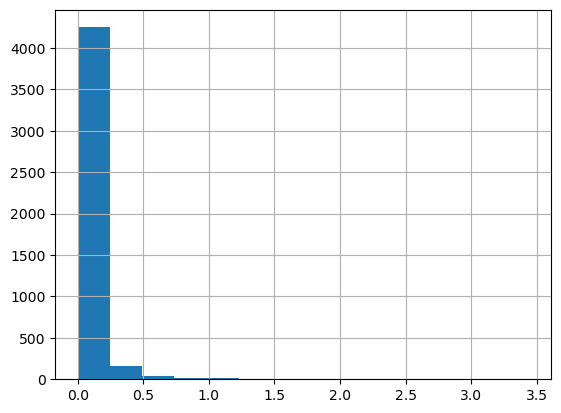

In [172]:
k = int(np.ceil(np.log2(len(df)) + 1)) 
df['length_of_stay'].hist(bins=k)
plt.show()  

lenght_of_stay distribuzione asimmetrica con skewness positiva

Come si evince dai grafici variabili come dog_age e lenght_of stay presentano una distribuzione asimmetrica, nelle prossime sezioni, all'occorrenza potrei applicare una trasformazione logaritimica di queste feature e anche alla luce di queste caratteristiche normalizzare con Min e Max Scaler.

- *plot pairwise correlation*
- *remove redundant variables*


Osservando meglio il dataset, ho notato che alcuni cani presentano un valore pari a 0.0 nelle variabili comportamentali:
good_with_children, good_with_other_dogs, shedding, grooming, drooling, coat_length, good_with_strangers, playfulness, protectiveness, trainability, energy, barking.

Questa condizione non sembra indicare un'assenza della caratteristica, ma piuttosto la mancanza totale di dati per quei record.

Per gestire questa problematica, prima di affrontare la riduzione delle variabili ridondanti, ho sostituito i valori 0.0 seguendo questa strategia:

Mediana della razza se disponibile.

Mediana di una razza simile, nel caso di incroci.

Mediana globale dell'intero dataset, se nessuna delle due precedenti era disponibile.

In [173]:
behavior_columns = [
    'playfulness', 'good_with_children', 'good_with_other_dogs',
    'shedding', 'grooming', 'drooling', 'coat_length',
    'good_with_strangers', 'protectiveness', 'trainability'
]
dogs_with_zero_behavior = df[(df[behavior_columns] == 0.0).all(axis=1)]

print(dogs_with_zero_behavior.shape) 


(113, 84)


In [174]:
dogs_with_zero_behavior.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,found_location,intake_condition,intake_type,...,breed_max_weight_male2,breed_max_weight_female2,breed_max_height_male2,breed_max_height_female2,breed_min_height_male2,breed_min_height_female2,breed_min_weight_male2,breed_min_weight_female2,dog_age,length_of_stay
4003,2014-06-08,Unknown,Adoption,Spayed Female,2015-06-15 12:29:00,Jack Russell Terrier Mix,White/Tan,Austin (TX),Normal,Stray,...,70.0,60.0,22.0,22.0,21.0,21.0,50.0,40.0,1.020603,0.019013
4007,2015-05-20,Unknown,Return to Owner,Neutered Male,2016-07-11 17:44:00,Rat Terrier Mix,Tricolor/Brown Brindle,6317 E Ben White Blvd in Austin (TX),Normal,Stray,...,70.0,60.0,22.0,22.0,21.0,21.0,50.0,40.0,1.147230,0.003408
4013,2014-12-12,Unknown,Return to Owner,Intact Female,2016-12-12 19:16:00,Catahoula Mix,Brown Brindle,9300 S Ih 35 Frontage Rd in Austin (TX),Normal,Stray,...,70.0,60.0,22.0,22.0,21.0,21.0,50.0,40.0,2.004939,0.008662
4021,2015-03-29,Unknown,Adoption,Spayed Female,2015-07-07 17:30:00,Bluetick Hound Mix,Blue Tick/Black,5400 Basswood Ln in Austin (TX),Normal,Stray,...,70.0,60.0,22.0,22.0,21.0,21.0,50.0,40.0,0.275970,0.022272
4027,2002-07-16,Suffering,Euthanasia,Intact Female,2014-07-16 09:36:00,Queensland Heeler Mix,Black/White,2109 Holly St in Austin (TX),Injured,Stray,...,70.0,60.0,22.0,22.0,21.0,21.0,50.0,40.0,12.009315,0.000036


La maggior parte dei cani privi di caratteristiche comportamentali appartiene alla categoria "other", che comprende razze pure o miste meno frequenti. 

Questi cani hanno un'età media di circa due anni e hanno trascorso un periodo relativamente breve nel rifugio, un fattore che probabilmente ha influenzato la mancata rilevazione delle loro caratteristiche comportamentali.

Per quanto riguarda gli outcome, questi cani sono principalmente associati a eventi di trasferimento, come adozione, ritorno al proprietario o, in alcuni casi, eutanasia.

In [175]:
print(dogs_with_zero_behavior['breed_category'].value_counts())  


breed_category
other    113
Name: count, dtype: int64


In [176]:
print(dogs_with_zero_behavior['Mixed_breed'].value_counts())  

Mixed_breed
1    106
0      7
Name: count, dtype: int64


In [177]:

print(dogs_with_zero_behavior['dog_age'].describe())


count    113.000000
mean       2.633642
std        2.871225
min        0.087395
25%        0.927433
50%        1.423777
75%        4.007325
max       14.037742
Name: dog_age, dtype: float64


In [178]:
print(dogs_with_zero_behavior['length_of_stay'].describe())  

count    113.000000
mean       0.024632
std        0.043104
min        0.000036
25%        0.005683
50%        0.013242
75%        0.022116
max        0.301608
Name: length_of_stay, dtype: float64


In [179]:

print(dogs_with_zero_behavior['outcome_type'].value_counts())  

outcome_type
Adoption           56
Return to Owner    28
Transfer           24
Euthanasia          5
Name: count, dtype: int64


Per riempire i valori ho implementato una funzione che riempe i valori mancanti con la mediana  della razza, della razza simie se non è presente la razza originale e dellla mediana globale in assenza delle altre due.

Ho scelto di usare la mediana per non alterare la distribuzione, per evitare di creare distrosioni e perchè molto probabilmente essendo i 113 cani con valori mancanti nella categoria 'other' non saranno usati nei notebook successive per le analisi.

In [180]:

def fill_zero_with_similar_breed(df, column_name, group_col='breed'):
    new_col = column_name + '2'
    df[new_col] = df[column_name]
    

    behavior_columns = [
        'playfulness', 'good_with_children', 'good_with_other_dogs',
        'shedding', 'grooming', 'drooling', 'coat_length',
        'good_with_strangers', 'protectiveness', 'trainability','energy','barking'
    ]
    
    mask_zero_dogs = (df[behavior_columns] == 0.0).all(axis=1)  
    
    
    def get_similar_breed(breed_name):
        if pd.isna(breed_name):
            return 'other'
        if 'Mix' in breed_name:
            return breed_name.replace('Mix', '').strip()
        if '/' in breed_name:
            return breed_name.split('/')[0].strip()
        return breed_name.strip()

    if 'similar_breed' not in df.columns:
        df['similar_breed'] = df[group_col].apply(get_similar_breed)

    breed_median = df.groupby(group_col)[column_name].transform('median')
    similar_breed_median = df.groupby('similar_breed')[column_name].transform('median')
    global_median = df[column_name].median()


    df.loc[mask_zero_dogs, new_col] = df.loc[mask_zero_dogs, new_col].mask(df[new_col] == 0.0, breed_median)
    df.loc[mask_zero_dogs, new_col] = df.loc[mask_zero_dogs, new_col].mask(df[new_col] == 0.0, similar_breed_median)
    df.loc[mask_zero_dogs, new_col] = df.loc[mask_zero_dogs, new_col].mask(df[new_col] == 0.0, global_median)

    zeri_iniziali = (df.loc[mask_zero_dogs, column_name] == 0.0).sum()
    zeri_finali = (df.loc[mask_zero_dogs, new_col] == 0.0).sum()
    print('Zeri iniziali in', column_name, ':', zeri_iniziali)
    print('Zeri rimasti in', new_col, ':', zeri_finali)

    return df



In [181]:
df['playfulness2'] = fill_zero_with_similar_breed(df, 'playfulness', 'breed')['playfulness2']
df['good_with_children2'] = fill_zero_with_similar_breed(df, 'good_with_children', 'breed')['good_with_children2']
df['good_with_other_dogs2'] = fill_zero_with_similar_breed(df, 'good_with_other_dogs', 'breed')['good_with_other_dogs2']
df['shedding2'] = fill_zero_with_similar_breed(df, 'shedding', 'breed')['shedding2']
df['grooming2'] = fill_zero_with_similar_breed(df, 'grooming', 'breed')['grooming2']
df['drooling2'] = fill_zero_with_similar_breed(df, 'drooling', 'breed')['drooling2']
df['coat_length2'] = fill_zero_with_similar_breed(df, 'coat_length', 'breed')['coat_length2']
df['good_with_strangers2'] = fill_zero_with_similar_breed(df, 'good_with_strangers', 'breed')['good_with_strangers2']
df['protectiveness2'] = fill_zero_with_similar_breed(df, 'protectiveness', 'breed')['protectiveness2']
df['trainability2'] = fill_zero_with_similar_breed(df, 'trainability', 'breed')['trainability2']
df['energy2'] = fill_zero_with_similar_breed(df, 'energy', 'breed')['energy2']
df['barking2'] = fill_zero_with_similar_breed(df, 'barking', 'breed')['barking2']



Zeri iniziali in playfulness : 113
Zeri rimasti in playfulness2 : 0
Zeri iniziali in good_with_children : 113
Zeri rimasti in good_with_children2 : 0
Zeri iniziali in good_with_other_dogs : 113
Zeri rimasti in good_with_other_dogs2 : 0
Zeri iniziali in shedding : 113
Zeri rimasti in shedding2 : 0
Zeri iniziali in grooming : 113
Zeri rimasti in grooming2 : 0
Zeri iniziali in drooling : 113
Zeri rimasti in drooling2 : 0
Zeri iniziali in coat_length : 113
Zeri rimasti in coat_length2 : 0
Zeri iniziali in good_with_strangers : 113
Zeri rimasti in good_with_strangers2 : 0
Zeri iniziali in protectiveness : 113
Zeri rimasti in protectiveness2 : 0
Zeri iniziali in trainability : 113
Zeri rimasti in trainability2 : 0
Zeri iniziali in energy : 113
Zeri rimasti in energy2 : 0
Zeri iniziali in barking : 113
Zeri rimasti in barking2 : 0


Come si evince dai grafici la distribuzione originale non è stata alterata, questo è dovuto anche al fatto che i record con 0.0 per tutte le caratteristiche comportamentali erano  solo 113

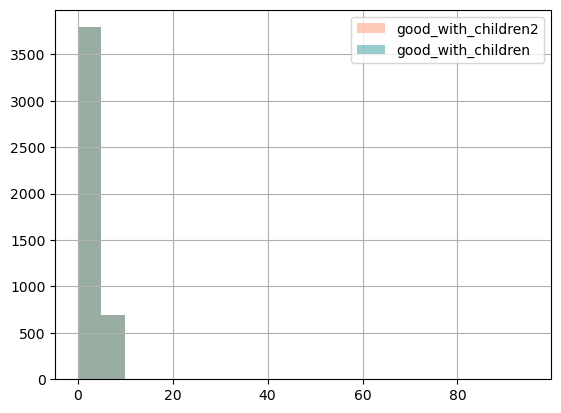

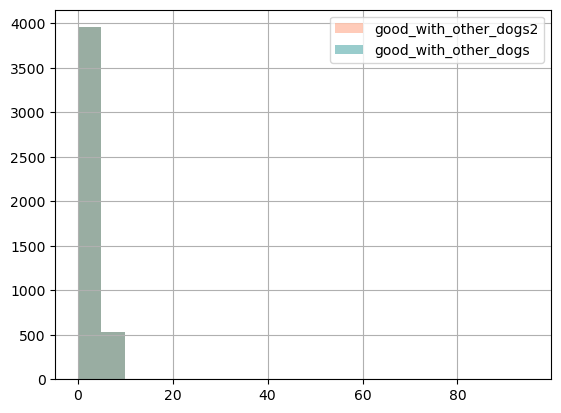

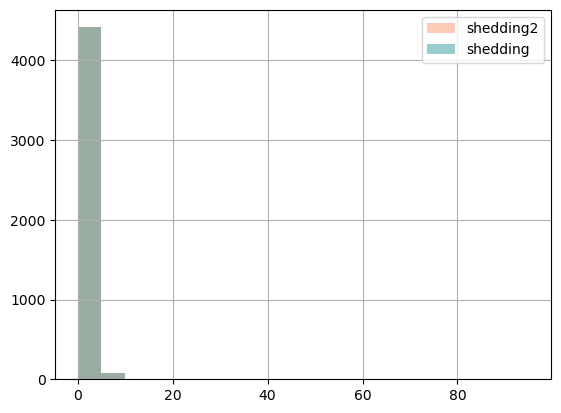

In [182]:
df['good_with_children2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='good_with_children2')
df['good_with_children'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='good_with_children')
plt.legend()
plt.show()


df['good_with_other_dogs2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='good_with_other_dogs2')
df['good_with_other_dogs'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='good_with_other_dogs')
plt.legend()
plt.show()


df['shedding2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='shedding2')
df['shedding'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='shedding')
plt.legend()
plt.show()


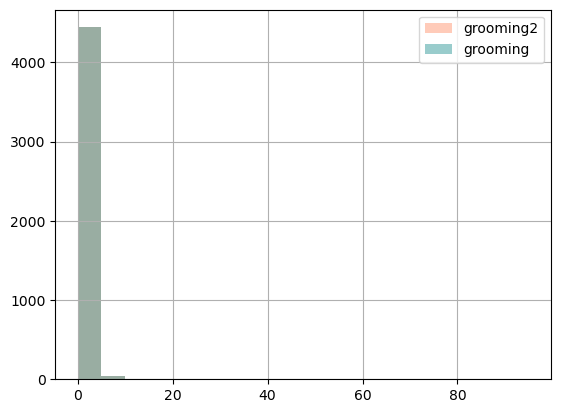

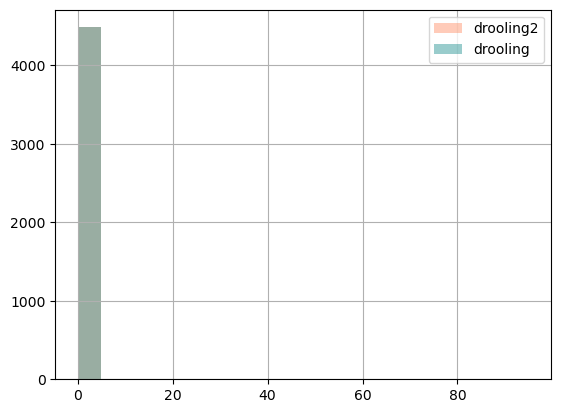

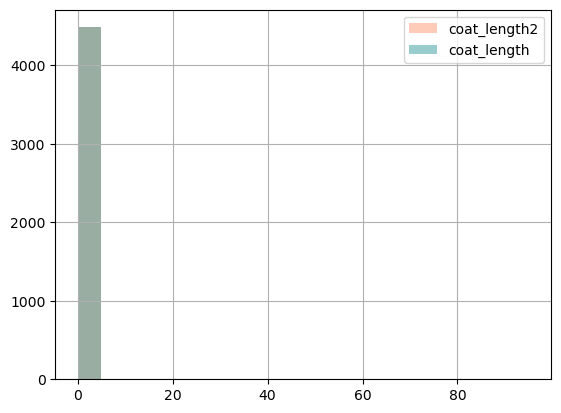

In [183]:
df['grooming2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='grooming2')
df['grooming'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='grooming')
plt.legend()
plt.show()


df['drooling2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='drooling2')
df['drooling'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='drooling')
plt.legend()
plt.show()


df['coat_length2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='coat_length2')
df['coat_length'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='coat_length')
plt.legend()
plt.show()        

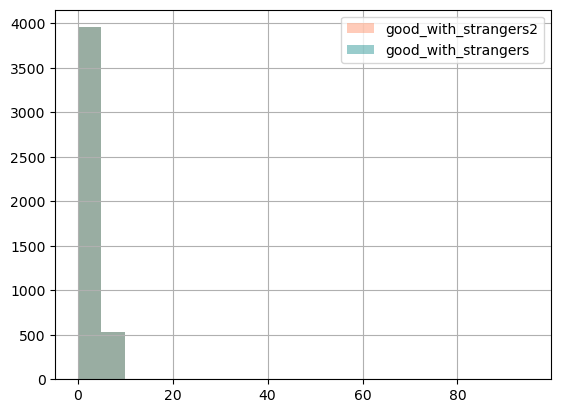

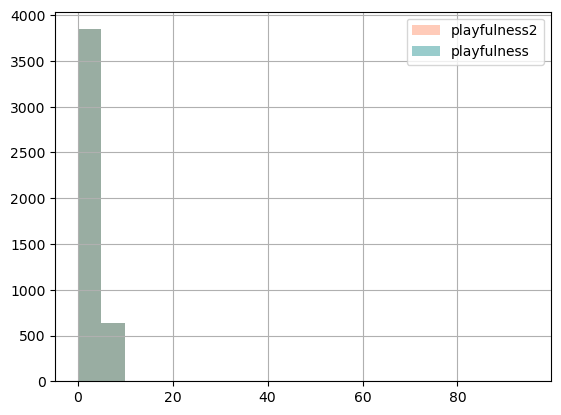

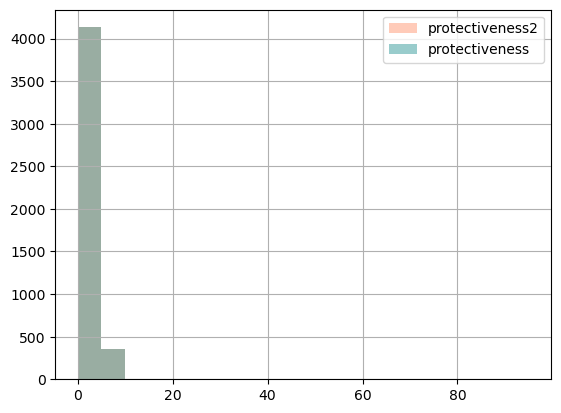

In [184]:
df['good_with_strangers2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='good_with_strangers2')
df['good_with_strangers'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='good_with_strangers')
plt.legend()
plt.show()


df['playfulness2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='playfulness2')
df['playfulness'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='playfulness')
plt.legend()
plt.show()


df['protectiveness2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='protectiveness2')
df['protectiveness'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='protectiveness')
plt.legend()
plt.show()      

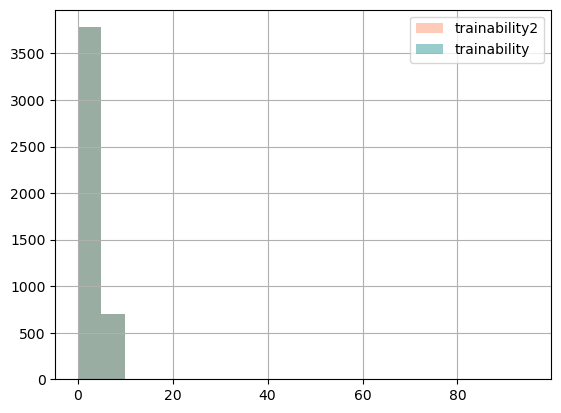

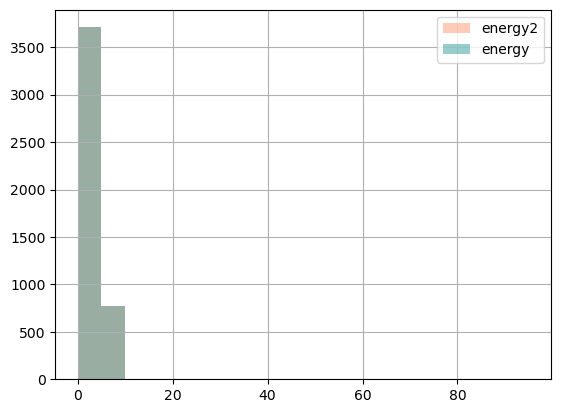

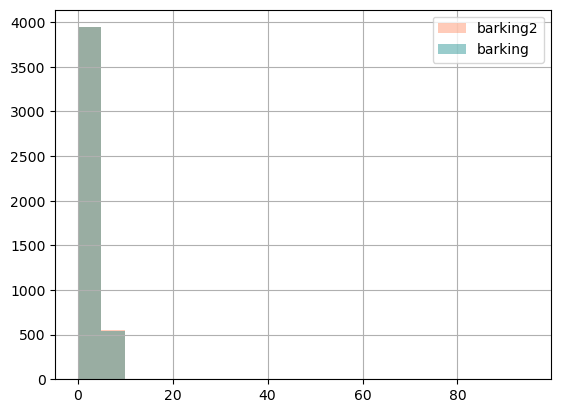

In [185]:
df['trainability2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='trainability2')
df['trainability'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='trainability')
plt.legend()
plt.show()


df['energy2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='energy2')
df['energy'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='energy')
plt.legend()
plt.show()


df['barking2'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='coral',label='barking2')
df['barking'].hist(bins=np.arange(0, 100, 5), alpha=0.4,color='teal',label='barking')
plt.legend()
plt.show()

Prima di effettuare  ulteriori pairwise correlations non considero le colonne con i null values, essendo stati riempiti.

Lasciarle porterebbe a correlazioni falsate con quelle create per gestire questo problema

<Axes: >

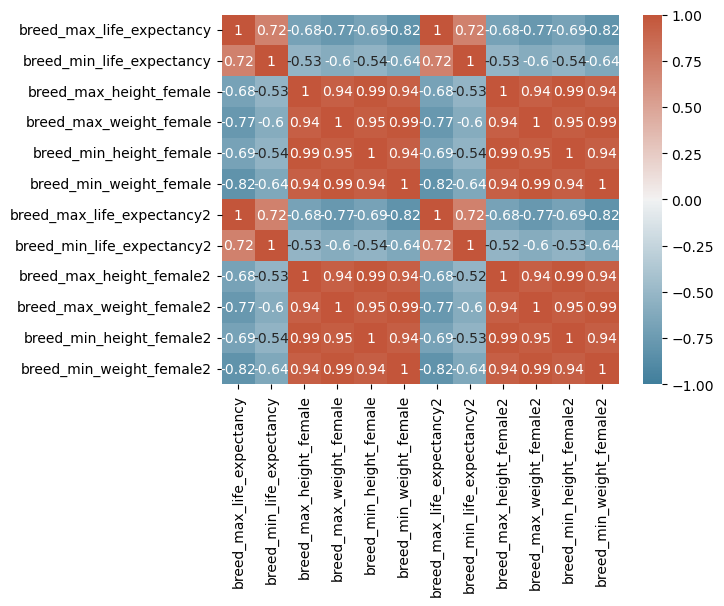

In [186]:
corr = df[['breed_max_life_expectancy','breed_min_life_expectancy', 
       'breed_max_height_female', 
       'breed_max_weight_female', 
       'breed_min_height_female', 
       'breed_min_weight_female',
       'breed_max_life_expectancy2','breed_min_life_expectancy2',
        'breed_max_height_female2',
        'breed_max_weight_female2', 
        'breed_min_height_female2','breed_min_weight_female2']].corr()
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, cmap=cmap, vmin=-1, vmax=1, annot=True)

<Axes: >

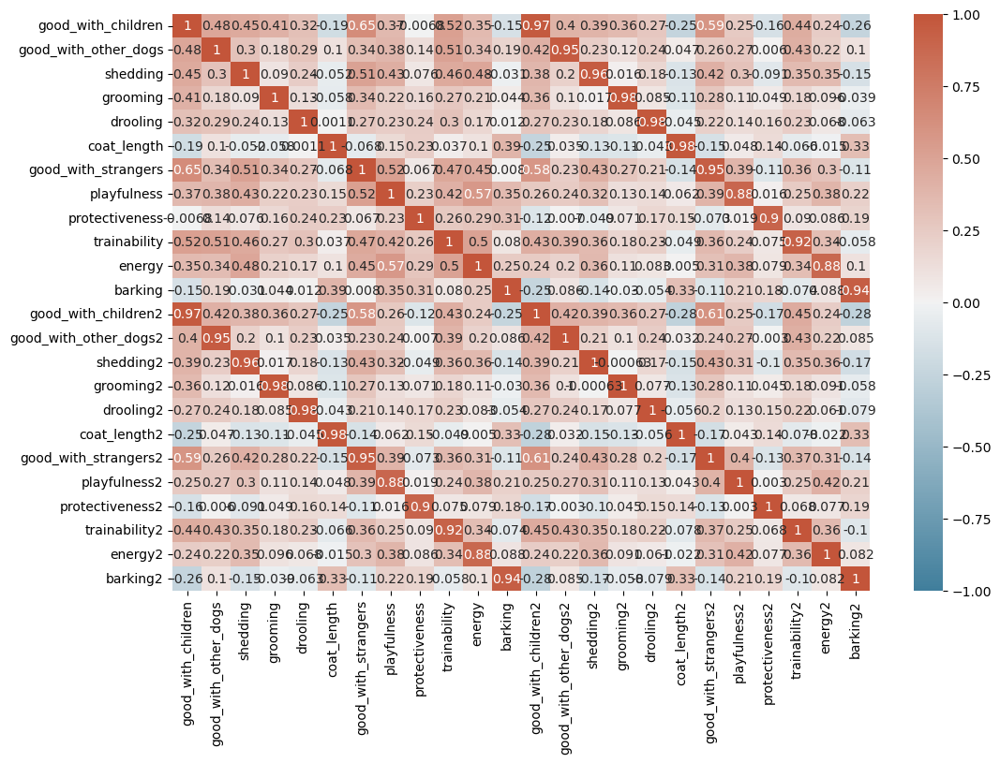

In [187]:
corr = df[['good_with_children', 'good_with_other_dogs',
       'shedding', 'grooming', 'drooling', 'coat_length',
       'good_with_strangers', 'playfulness', 'protectiveness', 'trainability',
       'energy', 'barking','good_with_children2', 'good_with_other_dogs2',
       'shedding2', 'grooming2', 'drooling2', 'coat_length2',
       'good_with_strangers2', 'playfulness2', 'protectiveness2', 'trainability2',
       'energy2', 'barking2']].corr()
plt.figure(figsize=(12, 8)) 
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, cmap=cmap, vmin=-1, vmax=1, annot=True)

<Axes: >

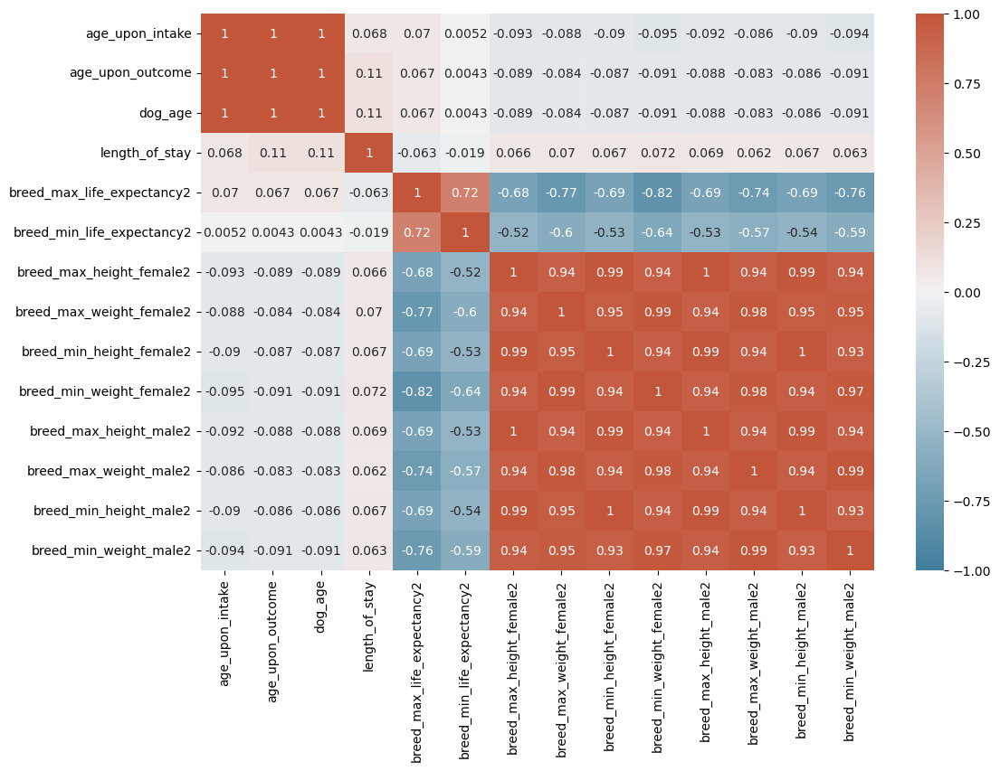

In [188]:
corr = df[['age_upon_intake',
       'age_upon_outcome',
           'dog_age',
       'length_of_stay',
       'breed_max_life_expectancy2','breed_min_life_expectancy2',
        'breed_max_height_female2',
        'breed_max_weight_female2', 
        'breed_min_height_female2','breed_min_weight_female2','breed_max_height_male2',
        'breed_max_weight_male2', 
        'breed_min_height_male2','breed_min_weight_male2']].corr()
plt.figure(figsize=(12, 8)) 
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, cmap=cmap, vmin=-1, vmax=1, annot=True)

Nonostante le correlazioni superiori a 0.9 per le variabili di altezza e peso e per le caratteristiche comportamentali dei cani, preferisco unire queste variabili ad esempio l'altezza massima dei maschi e delle femmine visto che potrebbero essere utili per ulteriori analisi e rimuovere solo quelle relative agli anni di intake e outcome hanno una relazione lineare positiva pari a 1 quindi sono rindondati con la varibile dog_age.

In [189]:
columns_to_merge = ['breed_max_height_male2', 'breed_max_height_female2',

       'breed_max_weight_male2', 'breed_max_weight_female2',

       'breed_min_height_male2', 'breed_min_height_female2',

       'breed_min_weight_male2', 'breed_min_weight_female2']
 
df['breed_max_height2'] = (df['breed_max_height_male2'] + df['breed_max_height_female2']) /2

df['breed_max_height2']
 
df['breed_max_weight2'] = (df['breed_max_weight_male2'] + df['breed_max_weight_female2']) /2

df['breed_max_weight2']
 
df['breed_min_weight2'] = (df['breed_min_weight_male2'] + df['breed_min_weight_female2']) /2

df['breed_min_weight2']
 
df['breed_min_height2'] = (df['breed_min_height_male2'] + df['breed_min_height_female2']) /2

df['breed_min_height2']


0       28.0
1       23.0
2        5.0
3        6.0
4        9.0
        ... 
4482    21.0
4483    21.0
4484    21.0
4485    21.0
4486    21.0
Name: breed_min_height2, Length: 4487, dtype: float64

<Axes: >

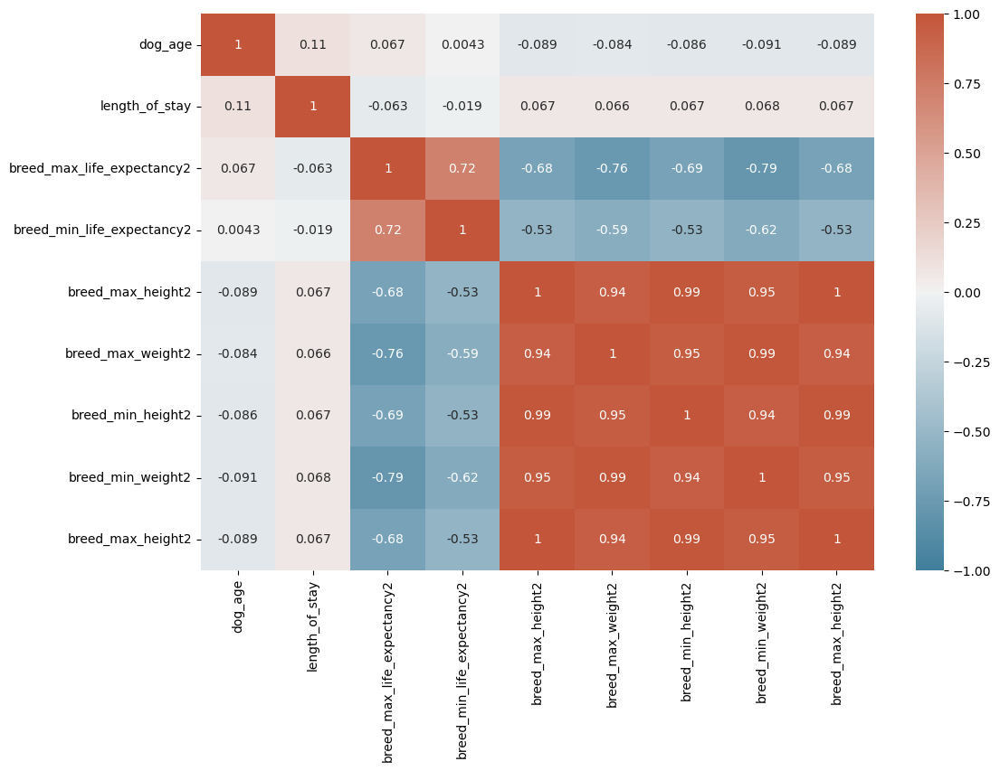

In [190]:
corr = df[['dog_age',
       'length_of_stay',
       'breed_max_life_expectancy2','breed_min_life_expectancy2',
        'breed_max_height2',
        'breed_max_weight2', 
        'breed_min_height2','breed_min_weight2','breed_max_height2']].corr()
plt.figure(figsize=(12, 8)) 
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, cmap=cmap, vmin=-1, vmax=1, annot=True)

Anche dopo l'unione le variabili risultano altamente correlate, per non perdere l'informazione ma gestire la dimensionalità creo due variabili per la media dell'latezza e del peso e quella relativa al rapporto tra altezza e peso

In [191]:
df['breed_avg_weight2'] = (df['breed_max_weight2'] + df['breed_min_weight2']) / 2
df['breed_avg_height2'] = (df['breed_max_height2'] + df['breed_min_height2']) / 2

In [192]:
df['weight_height_ratio'] = df['breed_avg_weight2'] / df['breed_avg_height2']

<Axes: >

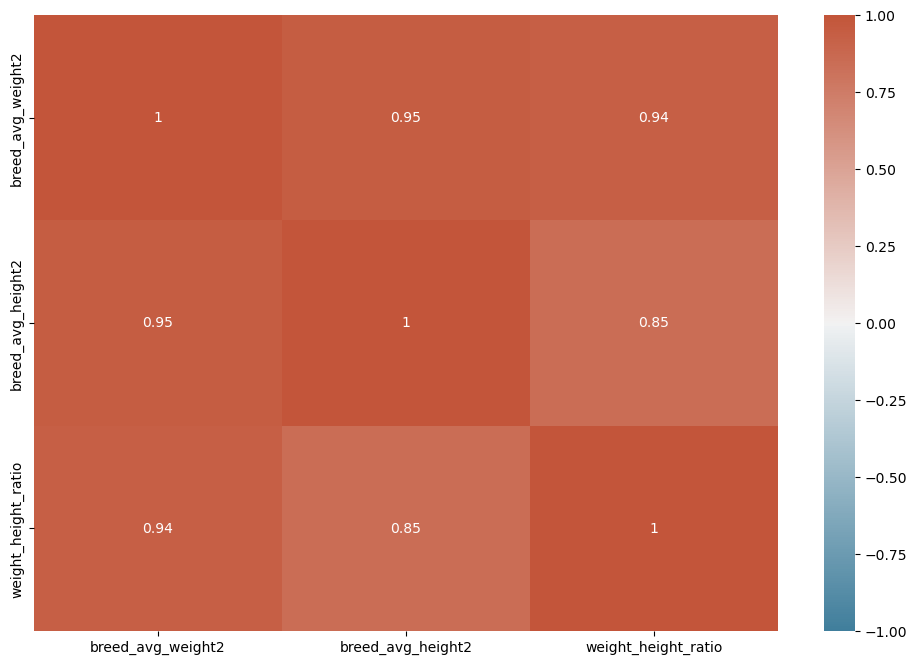

In [193]:
corr = df[['breed_avg_weight2', 'breed_avg_height2', 'weight_height_ratio']].corr()
plt.figure(figsize=(12, 8)) 
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, cmap=cmap, vmin=-1, vmax=1, annot=True)

In [194]:
df_no_redundant=df.drop(columns=[ 'breed_max_life_expectancy','breed_min_life_expectancy', 'breed_max_height_male',
       'breed_max_height_female', 'breed_max_weight_male',
       'breed_max_weight_female', 'breed_min_height_male',
       'breed_min_height_female', 'breed_min_weight_male',
       'breed_min_weight_female','age_upon_intake', 'age_upon_outcome','good_with_children', 'good_with_other_dogs',
       'shedding', 'grooming', 'drooling', 'coat_length',
       'good_with_strangers', 'playfulness', 'protectiveness', 'trainability',
       'energy', 'barking', 'breed_max_height_male2',
       'breed_max_height_female2', 'breed_max_weight_male2',
       'breed_max_weight_female2', 'breed_min_height_male2',
       'breed_min_height_female2', 'breed_min_weight_male2',
       'breed_min_weight_female2','breed_max_height2',
        'breed_max_weight2', 
        'breed_min_height2','breed_min_weight2','breed_max_height2'])

In [195]:
df_no_redundant.to_csv('versionepulitamed.csv', index=False)


In [196]:
saved_df = pd.read_csv('versionepulitamed.csv')

In [197]:
saved_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4487 entries, 0 to 4486
Data columns (total 68 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   date_of_birth               4487 non-null   object 
 1   outcome_subtype             4487 non-null   object 
 2   outcome_type                4487 non-null   object 
 3   sex_upon_outcome            4487 non-null   object 
 4   outcome_datetime            4487 non-null   object 
 5   breed                       4487 non-null   object 
 6   color                       4487 non-null   object 
 7   found_location              4487 non-null   object 
 8   intake_condition            4487 non-null   object 
 9   intake_type                 4487 non-null   object 
 10  sex_upon_intake             4487 non-null   object 
 11  count                       4487 non-null   int64  
 12  intake_datetime             4487 non-null   object 
 13  breed_category              4487 

Nei notebook successivi ho ulteriormente lavorato sul processamento del dataset normalizzando i dati e modificando ed eliminando le variabili.